# Hybrid Vit + Innovative Fusion for Medical Image Segmentation on Small Dataset

My teammate dropped the course, but the project proposal was for 2 person and team and I have completed the project as amit sir has given feedback. This is the updated file with more visualizations.

In [1]:
# =========================
# Step 1: Setup & Utilities
# =========================

import os
import random
import math
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

# Albumentations for augmentation (install if needed)
try:
    import albumentations as A
    from albumentations.pytorch import ToTensorV2
except ImportError:
    !pip install -q albumentations==1.4.6
    import albumentations as A
    from albumentations.pytorch import ToTensorV2

# Optional: timm for transformer backbone later
try:
    import timm
except ImportError:
    !pip install -q timm
    import timm

print("Torch:", torch.__version__)
print("Albumentations:", A.__version__)
print("timm:", timm.__version__)


/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

Torch: 2.6.0+cu124
Albumentations: 2.0.8
timm: 1.0.19


In [2]:
# =========================
# Experiment Configuration
# =========================

class CFG:
    # You can change these later
    img_size = (256, 256)       # resize all images
    batch_size = 16
    num_workers = 2
    seed = 42

    # IMPORTANT: set this to your actual Kvasir-SEG path on Kaggle
    # Example if you added a Kaggle dataset:
    # data_root = "/kaggle/input/kvasir-seg/Kvasir-SEG"
    data_root = "/kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG"  # EDIT IF NEEDED

    train_split = 0.8
    val_split = 0.1
    test_split = 0.1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(CFG.seed)


Using device: cpu


In [3]:
# =========================
# Check Kvasir-SEG structure
# =========================

data_root = Path(CFG.data_root)
print("Data root exists:", data_root.exists())
print("Contents:", [p.name for p in data_root.iterdir()] if data_root.exists() else "MISSING")

# Many Kvasir-SEG copies follow:
#  - /Kvasir-SEG/images
#  - /Kvasir-SEG/masks
# or similar.
# Adjust the code below if your structure is different.

images_dir = data_root / "images"
masks_dir = data_root / "masks"

print("Images dir:", images_dir, "| exists:", images_dir.exists())
print("Masks dir:", masks_dir, "| exists:", masks_dir.exists())


Data root exists: True
Contents: ['annotated_images', 'bbox', 'images', '1911.07069.pdf', 'masks']
Images dir: /kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG/images | exists: True
Masks dir: /kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG/masks | exists: True


In [37]:
# =========================
# Step 2: Dataset + Loader
# =========================

import glob
from sklearn.model_selection import train_test_split

# ---- 1) Collect image paths ----
image_paths = sorted(glob.glob(str(images_dir / "*.jpg"))) + \
              sorted(glob.glob(str(images_dir / "*.png")))

mask_paths = sorted(glob.glob(str(masks_dir / "*.jpg"))) + \
             sorted(glob.glob(str(masks_dir / "*.png")))

print("Total images:", len(image_paths))
print("Total masks:", len(mask_paths))


# ---- 2) Train/Val/Test Split (0.8 / 0.1 / 0.1) ----
train_imgs, temp_imgs, train_masks, temp_masks = train_test_split(
    image_paths, mask_paths, test_size=0.2, random_state=CFG.seed
)

val_imgs, test_imgs, val_masks, test_masks = train_test_split(
    temp_imgs, temp_masks, test_size=0.5, random_state=CFG.seed
)

print(f"Train: {len(train_imgs)}, Val: {len(val_imgs)}, Test: {len(test_imgs)}")


# ---- 3) Dataset Class ----
class KvasirDataset(Dataset):
    def __init__(self, images, masks, augment=False):
        self.images = images
        self.masks = masks
        self.augment = augment
        
        if augment:
            self.transform = A.Compose([
                A.Resize(CFG.img_size[0], CFG.img_size[1]),
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.5),
                A.RandomBrightnessContrast(p=0.3),
                ToTensorV2(),
            ])
        else:
            self.transform = A.Compose([
                A.Resize(CFG.img_size[0], CFG.img_size[1]),
                ToTensorV2(),
            ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = np.array(Image.open(self.images[idx]).convert("RGB"))
        mask = np.array(Image.open(self.masks[idx]).convert("L"))

        mask = (mask > 127).astype(np.float32)  # binary mask

        transformed = self.transform(image=img, mask=mask)
        mask = transformed["mask"].unsqueeze(0).float()   # force float32
        img = transformed["image"].float()                # ensure image is float32
        return img, mask


# ---- 4) Create loaders ----
train_ds = KvasirDataset(train_imgs, train_masks, augment=True)
val_ds   = KvasirDataset(val_imgs, val_masks, augment=False)
test_ds  = KvasirDataset(test_imgs, test_masks, augment=False)

train_loader = DataLoader(train_ds, batch_size=CFG.batch_size, shuffle=True, num_workers=CFG.num_workers,pin_memory=True, persistent_workers=True)
val_loader   = DataLoader(val_ds, batch_size=CFG.batch_size, shuffle=False, num_workers=CFG.num_workers,pin_memory=True, persistent_workers=True)
test_loader  = DataLoader(test_ds, batch_size=CFG.batch_size, shuffle=False, num_workers=CFG.num_workers,pin_memory=True, persistent_workers=True)

print("DataLoaders ready.")


Total images: 1000
Total masks: 1000
Train: 800, Val: 100, Test: 100
DataLoaders ready.


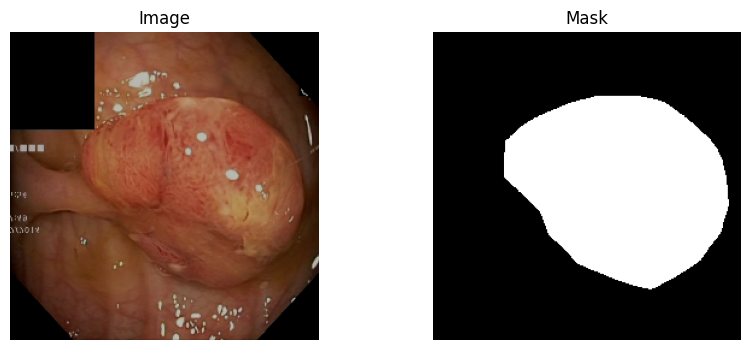

In [5]:
# =========================
# Safe Visualization Block
# =========================

img, mask = next(iter(train_loader))

img_vis = img[0].permute(1,2,0).cpu().numpy()

# Fix: if image is in [0,255], convert to [0,1]
if img_vis.max() > 1.0:
    img_vis = img_vis / 255.0

# --- mask handling ---
mask0 = mask[0]

if mask0.ndim == 3 and mask0.shape[0] == 1:
    mask_vis = mask0.squeeze(0).cpu().numpy()
elif mask0.ndim == 2:
    mask_vis = mask0.cpu().numpy()
else:
    raise ValueError(f"Unexpected mask shape: {mask0.shape}")

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.imshow(img_vis); plt.title("Image"); plt.axis("off")
plt.subplot(1,2,2); plt.imshow(mask_vis, cmap="gray"); plt.title("Mask"); plt.axis("off")
plt.show()


# U-Net Baseline

In [6]:
# =========================
# Step 3: U-Net Baseline
# =========================

class DoubleConv(nn.Module):
    """
    Conv -> BN -> ReLU -> Conv -> BN -> ReLU
    """
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.net(x)


class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, features=[64, 128, 256, 512]):
        super().__init__()

        # Encoder
        self.downs = nn.ModuleList()
        self.pools = nn.ModuleList()
        for feature in features:
            self.downs.append(DoubleConv(in_channels, feature))
            self.pools.append(nn.MaxPool2d(kernel_size=2, stride=2))
            in_channels = feature

        # Bottleneck
        self.bottleneck = DoubleConv(features[-1], features[-1] * 2)

        # Decoder
        self.ups = nn.ModuleList()
        self.up_convs = nn.ModuleList()

        rev_features = features[::-1]
        for feature in rev_features:
            self.ups.append(nn.ConvTranspose2d(feature * 2, feature, kernel_size=2, stride=2))
            self.up_convs.append(DoubleConv(feature * 2, feature))

        # Final output layer
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        skip_connections = []

        # Encoder path
        for idx, down in enumerate(self.downs):
            x = down(x)
            skip_connections.append(x)
            x = self.pools[idx](x)

        # Bottleneck
        x = self.bottleneck(x)

        # Decoder path
        skip_connections = skip_connections[::-1]

        for idx in range(len(self.ups)):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx]

            # Padding if size mismatch (common)
            if x.shape != skip_connection.shape:
                x = nn.functional.interpolate(x, size=skip_connection.shape[2:], mode="bilinear", align_corners=False)

            x = torch.cat((skip_connection, x), dim=1)
            x = self.up_convs[idx](x)

        return self.final_conv(x)


In [7]:
# =========================
# Step 4: Losses & Training Utils
# =========================
from tqdm import tqdm
# --------- Dice Coefficient ----------
def dice_coef(pred, target, smooth=1e-7):
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5).float()

    intersection = (pred * target).sum(dim=(1,2,3))
    union = pred.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3))
    dice = (2 * intersection + smooth) / (union + smooth)
    return dice.mean()


# --------- IoU ----------
def iou_coef(pred, target, smooth=1e-7):
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5).float()

    intersection = (pred * target).sum(dim=(1,2,3))
    union = pred.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3)) - intersection
    iou = (intersection + smooth) / (union + smooth)
    return iou.mean()


# --------- Dice Loss ----------
class DiceLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, pred, target, smooth=1e-7):
        pred = torch.sigmoid(pred)
        intersection = (pred * target).sum(dim=(1,2,3))
        union = pred.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3))
        dice = (2 * intersection + smooth) / (union + smooth)
        return 1 - dice.mean()


# --------- BCE + Dice Combined Loss ----------
class BCEDiceLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.dice = DiceLoss()

    def forward(self, pred, target):
        return self.bce(pred, target) + self.dice(pred, target)

# =========================
# Additional Metrics: Sensitivity, Specificity, Accuracy
# =========================

def get_confusion_components(pred, target):
    """
    pred, target: B × 1 × H × W (binary 0/1)
    """
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5).float()

    TP = (pred * target).sum(dim=(1,2,3))
    TN = ((1 - pred) * (1 - target)).sum(dim=(1,2,3))
    FP = (pred * (1 - target)).sum(dim=(1,2,3))
    FN = ((1 - pred) * target).sum(dim=(1,2,3))

    return TP, TN, FP, FN


def sensitivity(pred, target, smooth=1e-7):
    TP, TN, FP, FN = get_confusion_components(pred, target)
    return ((TP + smooth) / (TP + FN + smooth)).mean()


def specificity(pred, target, smooth=1e-7):
    TP, TN, FP, FN = get_confusion_components(pred, target)
    return ((TN + smooth) / (TN + FP + smooth)).mean()


def accuracy(pred, target, smooth=1e-7):
    TP, TN, FP, FN = get_confusion_components(pred, target)
    total = TP + TN + FP + FN
    return ((TP + TN + smooth) / (total + smooth)).mean()

# --------- One Epoch Train Function ----------
def train_one_epoch(model, loader, optimizer, loss_fn):
    model.train()
    epoch_loss = 0
    epoch_dice = 0
    epoch_iou = 0
    epoch_sens = 0
    epoch_spec = 0
    epoch_acc  = 0

    


    pbar = tqdm(loader, total=len(loader), desc="Training", leave=False)
    
    for imgs, masks in pbar:
        imgs = imgs.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()
        preds = model(imgs)

        loss = loss_fn(preds, masks)
        loss.backward()
        optimizer.step()

        # Metrics
        epoch_loss += loss.item()
        epoch_dice += dice_coef(preds, masks).item()
        epoch_iou += iou_coef(preds, masks).item()
        TP, TN, FP, FN = get_confusion_components(preds, masks)

        epoch_sens += sensitivity(preds, masks).item()
        epoch_spec += specificity(preds, masks).item()
        epoch_acc  += accuracy(preds, masks).item()

    n = len(loader)
    return (epoch_loss / n, epoch_dice / n, epoch_iou / n,
        epoch_sens / n, epoch_spec / n, epoch_acc / n)


# --------- Validation Function ----------
def validate_one_epoch(model, loader, loss_fn):
    model.eval()
    epoch_loss = 0
    epoch_dice = 0
    epoch_iou = 0
    epoch_sens = 0
    epoch_spec = 0
    epoch_acc  = 0

    pbar = tqdm(loader, total=len(loader), desc="Validating", leave=False)
    with torch.no_grad():
        for imgs, masks in pbar:
            imgs = imgs.to(device)
            masks = masks.to(device)

            preds = model(imgs)
            loss = loss_fn(preds, masks)

            epoch_loss += loss.item()
            epoch_dice += dice_coef(preds, masks).item()
            epoch_iou += iou_coef(preds, masks).item()
            TP, TN, FP, FN = get_confusion_components(preds, masks)

            epoch_sens += sensitivity(preds, masks).item()
            epoch_spec += specificity(preds, masks).item()
            epoch_acc  += accuracy(preds, masks).item()

    n = len(loader)
    return (epoch_loss / n, epoch_dice / n, epoch_iou / n,
        epoch_sens / n, epoch_spec / n, epoch_acc / n)



Epoch [1/40]


Train => Loss: 1.2298 | Dice: 0.4247 | IoU: 0.3018
         SE:   0.7285 | SP:   0.7682 | ACC: 0.7500
Val   => Loss: 1.0698   | Dice: 0.5548 | IoU: 0.4204
         SE:   0.6485   | SP:   0.9309   | ACC: 0.8762
----------------------------------------------------------------------

Epoch [2/40]


Train => Loss: 1.0742 | Dice: 0.5246 | IoU: 0.3914
         SE:   0.7018 | SP:   0.8920 | ACC: 0.8526
Val   => Loss: 1.0339   | Dice: 0.5544 | IoU: 0.4217
         SE:   0.8596   | SP:   0.8307   | ACC: 0.8231
----------------------------------------------------------------------

Epoch [3/40]


Train => Loss: 1.0110 | Dice: 0.5351 | IoU: 0.4078
         SE:   0.7052 | SP:   0.9012 | ACC: 0.8633
Val   => Loss: 1.2504   | Dice: 0.5054 | IoU: 0.3672
         SE:   0.9092   | SP:   0.7563   | ACC: 0.7687
----------------------------------------------------------------------

Epoch [4/40]


Train => Loss: 0.9642 | Dice: 0.5594 | IoU: 0.4316
         SE:   0.7371 | SP:   0.9008 | ACC: 0.8663
Val   => Loss: 0.9004   | Dice: 0.5909 | IoU: 0.4763
         SE:   0.7292   | SP:   0.9284   | ACC: 0.8864
----------------------------------------------------------------------

Epoch [5/40]


Train => Loss: 0.9047 | Dice: 0.5936 | IoU: 0.4653
         SE:   0.7714 | SP:   0.9082 | ACC: 0.8786
Val   => Loss: 0.8107   | Dice: 0.6541 | IoU: 0.5378
         SE:   0.7291   | SP:   0.9573   | ACC: 0.9089
----------------------------------------------------------------------

Epoch [6/40]


Train => Loss: 0.8475 | Dice: 0.6324 | IoU: 0.5070
         SE:   0.7948 | SP:   0.9239 | ACC: 0.8933
Val   => Loss: 0.8033   | Dice: 0.6882 | IoU: 0.5853
         SE:   0.7302   | SP:   0.9750   | ACC: 0.9197
----------------------------------------------------------------------

Epoch [7/40]


Train => Loss: 0.8009 | Dice: 0.6624 | IoU: 0.5384
         SE:   0.8092 | SP:   0.9320 | ACC: 0.9023
Val   => Loss: 0.8209   | Dice: 0.6495 | IoU: 0.5297
         SE:   0.8710   | SP:   0.8965   | ACC: 0.8808
----------------------------------------------------------------------

Epoch [8/40]


Train => Loss: 0.7700 | Dice: 0.6743 | IoU: 0.5540
         SE:   0.8133 | SP:   0.9372 | ACC: 0.9060
Val   => Loss: 0.7748   | Dice: 0.6509 | IoU: 0.5432
         SE:   0.6506   | SP:   0.9799   | ACC: 0.9156
----------------------------------------------------------------------

Epoch [9/40]


Train => Loss: 0.7175 | Dice: 0.7087 | IoU: 0.5903
         SE:   0.8343 | SP:   0.9448 | ACC: 0.9159
Val   => Loss: 0.6789   | Dice: 0.7009 | IoU: 0.5846
         SE:   0.8396   | SP:   0.9394   | ACC: 0.9136
----------------------------------------------------------------------

Epoch [10/40]


Train => Loss: 0.6886 | Dice: 0.7127 | IoU: 0.5980
         SE:   0.8277 | SP:   0.9506 | ACC: 0.9197
Val   => Loss: 0.6216   | Dice: 0.7395 | IoU: 0.6349
         SE:   0.7615   | SP:   0.9761   | ACC: 0.9316
----------------------------------------------------------------------
Model saved: unet_epoch_10.pth


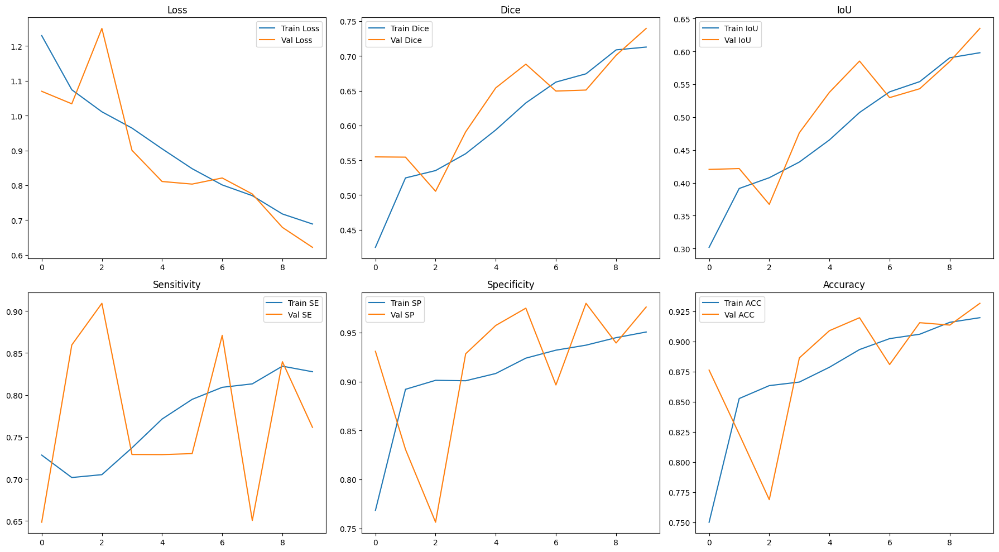


Epoch [11/40]


Train => Loss: 0.6544 | Dice: 0.7249 | IoU: 0.6123
         SE:   0.8393 | SP:   0.9488 | ACC: 0.9228
Val   => Loss: 0.6253   | Dice: 0.7439 | IoU: 0.6345
         SE:   0.8506   | SP:   0.9494   | ACC: 0.9248
----------------------------------------------------------------------

Epoch [12/40]


Train => Loss: 0.6162 | Dice: 0.7471 | IoU: 0.6396
         SE:   0.8441 | SP:   0.9582 | ACC: 0.9297
Val   => Loss: 0.5996   | Dice: 0.7529 | IoU: 0.6499
         SE:   0.8181   | SP:   0.9651   | ACC: 0.9314
----------------------------------------------------------------------

Epoch [13/40]


Train => Loss: 0.5966 | Dice: 0.7557 | IoU: 0.6501
         SE:   0.8496 | SP:   0.9588 | ACC: 0.9306
Val   => Loss: 0.6706   | Dice: 0.7058 | IoU: 0.6006
         SE:   0.8749   | SP:   0.9162   | ACC: 0.8991
----------------------------------------------------------------------

Epoch [14/40]


Train => Loss: 0.5680 | Dice: 0.7669 | IoU: 0.6612
         SE:   0.8550 | SP:   0.9618 | ACC: 0.9338
Val   => Loss: 0.5335   | Dice: 0.7794 | IoU: 0.6771
         SE:   0.8363   | SP:   0.9699   | ACC: 0.9378
----------------------------------------------------------------------

Epoch [15/40]


Train => Loss: 0.5382 | Dice: 0.7799 | IoU: 0.6782
         SE:   0.8637 | SP:   0.9643 | ACC: 0.9372
Val   => Loss: 0.6408   | Dice: 0.7082 | IoU: 0.5956
         SE:   0.9124   | SP:   0.9142   | ACC: 0.9039
----------------------------------------------------------------------

Epoch [16/40]


Train => Loss: 0.5266 | Dice: 0.7821 | IoU: 0.6816
         SE:   0.8534 | SP:   0.9671 | ACC: 0.9390
Val   => Loss: 0.6158   | Dice: 0.7177 | IoU: 0.6056
         SE:   0.9268   | SP:   0.9097   | ACC: 0.9026
----------------------------------------------------------------------

Epoch [17/40]


Train => Loss: 0.5040 | Dice: 0.7958 | IoU: 0.7008
         SE:   0.8535 | SP:   0.9706 | ACC: 0.9415
Val   => Loss: 0.5702   | Dice: 0.7427 | IoU: 0.6416
         SE:   0.9042   | SP:   0.9265   | ACC: 0.9148
----------------------------------------------------------------------

Epoch [18/40]


Train => Loss: 0.4850 | Dice: 0.7962 | IoU: 0.6989
         SE:   0.8665 | SP:   0.9683 | ACC: 0.9414
Val   => Loss: 0.4731   | Dice: 0.7925 | IoU: 0.6999
         SE:   0.8073   | SP:   0.9811   | ACC: 0.9443
----------------------------------------------------------------------

Epoch [19/40]


Train => Loss: 0.4725 | Dice: 0.8014 | IoU: 0.7047
         SE:   0.8555 | SP:   0.9718 | ACC: 0.9430
Val   => Loss: 0.4466   | Dice: 0.8117 | IoU: 0.7149
         SE:   0.8406   | SP:   0.9800   | ACC: 0.9465
----------------------------------------------------------------------

Epoch [20/40]


Train => Loss: 0.4360 | Dice: 0.8213 | IoU: 0.7301
         SE:   0.8733 | SP:   0.9734 | ACC: 0.9488
Val   => Loss: 0.4855   | Dice: 0.7847 | IoU: 0.6845
         SE:   0.7806   | SP:   0.9844   | ACC: 0.9437
----------------------------------------------------------------------
Model saved: unet_epoch_20.pth


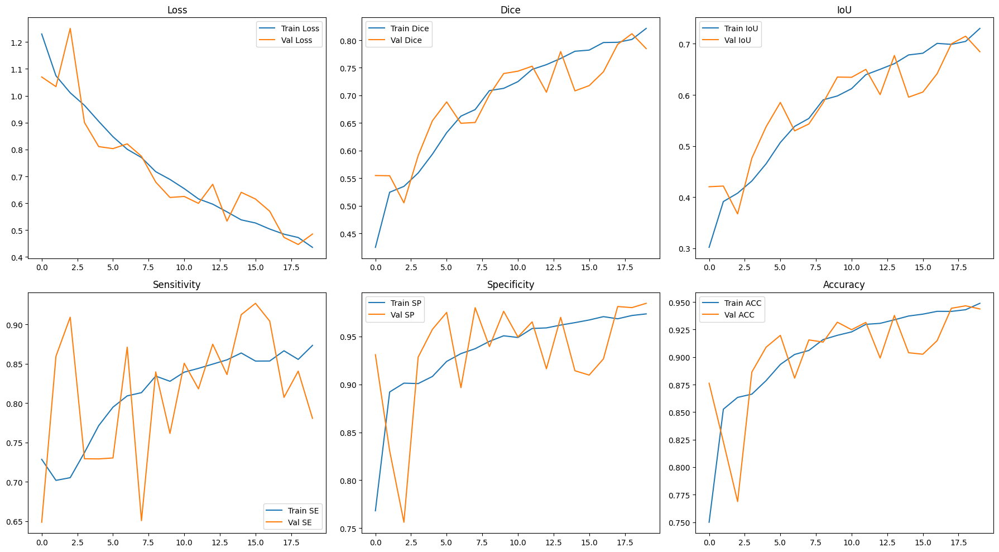


Epoch [21/40]


Train => Loss: 0.4436 | Dice: 0.8067 | IoU: 0.7139
         SE:   0.8620 | SP:   0.9710 | ACC: 0.9455
Val   => Loss: 0.4568   | Dice: 0.7865 | IoU: 0.6933
         SE:   0.8462   | SP:   0.9703   | ACC: 0.9425
----------------------------------------------------------------------

Epoch [22/40]


Train => Loss: 0.4285 | Dice: 0.8198 | IoU: 0.7292
         SE:   0.8663 | SP:   0.9749 | ACC: 0.9479
Val   => Loss: 0.4382   | Dice: 0.8027 | IoU: 0.7116
         SE:   0.8073   | SP:   0.9840   | ACC: 0.9488
----------------------------------------------------------------------

Epoch [23/40]


Train => Loss: 0.4009 | Dice: 0.8308 | IoU: 0.7430
         SE:   0.8761 | SP:   0.9752 | ACC: 0.9507
Val   => Loss: 0.4180   | Dice: 0.8046 | IoU: 0.7083
         SE:   0.8434   | SP:   0.9759   | ACC: 0.9477
----------------------------------------------------------------------

Epoch [24/40]


Train => Loss: 0.3881 | Dice: 0.8327 | IoU: 0.7467
         SE:   0.8698 | SP:   0.9774 | ACC: 0.9530
Val   => Loss: 0.4136   | Dice: 0.8040 | IoU: 0.7096
         SE:   0.8875   | SP:   0.9663   | ACC: 0.9463
----------------------------------------------------------------------

Epoch [25/40]


Train => Loss: 0.3706 | Dice: 0.8432 | IoU: 0.7582
         SE:   0.8781 | SP:   0.9780 | ACC: 0.9545
Val   => Loss: 0.4341   | Dice: 0.7879 | IoU: 0.6863
         SE:   0.8488   | SP:   0.9689   | ACC: 0.9439
----------------------------------------------------------------------

Epoch [26/40]


Train => Loss: 0.3832 | Dice: 0.8346 | IoU: 0.7487
         SE:   0.8742 | SP:   0.9773 | ACC: 0.9522
Val   => Loss: 0.5178   | Dice: 0.7492 | IoU: 0.6438
         SE:   0.8969   | SP:   0.9331   | ACC: 0.9207
----------------------------------------------------------------------

Epoch [27/40]


KeyboardInterrupt: 

In [8]:
# =========================
# FINAL TRAINING CALL (40 epochs, save every 10 epochs)
# =========================

num_epochs = 40

train_losses = []
val_losses   = []

train_dices = []
val_dices   = []

train_ious = []
val_ious   = []

train_sens = []
val_sens   = []

train_specs = []
val_specs   = []

train_accs = []
val_accs   = []

model_unet = UNet().to(device)
optimizer  = torch.optim.AdamW(model_unet.parameters(), lr=1e-4)
loss_fn    = BCEDiceLoss()

for epoch in range(1, num_epochs + 1):

    print(f"\nEpoch [{epoch}/{num_epochs}]")

    # -------- Training --------
    (train_loss, train_dice, train_iou,
     train_se, train_sp, train_acc) = train_one_epoch(
        model_unet, train_loader, optimizer, loss_fn
    )

    # -------- Validation --------
    (val_loss, val_dice, val_iou,
     val_se, val_sp, val_acc) = validate_one_epoch(
        model_unet, val_loader, loss_fn
    )

    # --------- Store Logs ---------
    train_losses.append(train_loss)
    val_losses.append(val_loss)

    train_dices.append(train_dice)
    val_dices.append(val_dice)

    train_ious.append(train_iou)
    val_ious.append(val_iou)

    train_sens.append(train_se)
    val_sens.append(val_se)

    train_specs.append(train_sp)
    val_specs.append(val_sp)

    train_accs.append(train_acc)
    val_accs.append(val_acc)

    # --------- Print Epoch Summary ---------
    print(f"Train => Loss: {train_loss:.4f} | Dice: {train_dice:.4f} | IoU: {train_iou:.4f}")
    print(f"         SE:   {train_se:.4f} | SP:   {train_sp:.4f} | ACC: {train_acc:.4f}")

    print(f"Val   => Loss: {val_loss:.4f}   | Dice: {val_dice:.4f} | IoU: {val_iou:.4f}")
    print(f"         SE:   {val_se:.4f}   | SP:   {val_sp:.4f}   | ACC: {val_acc:.4f}")
    print("-" * 70)

    # -------- SAVE MODEL EVERY 10 EPOCHS --------
    if epoch % 10 == 0:
        save_name = f"unet_epoch_{epoch}.pth"
        torch.save(model_unet.state_dict(), save_name)
        print(f"Model saved: {save_name}")

        # -------- Plot curves every 10 epochs --------
        fig, axes = plt.subplots(2, 3, figsize=(18,10))

        axes[0,0].plot(train_losses, label="Train Loss")
        axes[0,0].plot(val_losses, label="Val Loss")
        axes[0,0].set_title("Loss"); axes[0,0].legend()

        axes[0,1].plot(train_dices, label="Train Dice")
        axes[0,1].plot(val_dices, label="Val Dice")
        axes[0,1].set_title("Dice"); axes[0,1].legend()

        axes[0,2].plot(train_ious, label="Train IoU")
        axes[0,2].plot(val_ious, label="Val IoU")
        axes[0,2].set_title("IoU"); axes[0,2].legend()

        axes[1,0].plot(train_sens, label="Train SE")
        axes[1,0].plot(val_sens, label="Val SE")
        axes[1,0].set_title("Sensitivity"); axes[1,0].legend()

        axes[1,1].plot(train_specs, label="Train SP")
        axes[1,1].plot(val_specs, label="Val SP")
        axes[1,1].set_title("Specificity"); axes[1,1].legend()

        axes[1,2].plot(train_accs, label="Train ACC")
        axes[1,2].plot(val_accs, label="Val ACC")
        axes[1,2].set_title("Accuracy"); axes[1,2].legend()

        plt.tight_layout()
        plt.show()

# =========================
# Save FINAL MODEL
# =========================
torch.save(model_unet.state_dict(), "unet_final_40epochs.pth")
print("Final model saved as unet_final_40epochs.pth")


Loaded model from epoch 20. Continuing training from epoch 21...

Epoch [21/40]


Train => Loss: 0.4300 | Dice: 0.8174 | IoU: 0.7245
         SE: 0.8724 | SP: 0.9727 | ACC: 0.9477
Val   => Loss: 0.4394 | Dice: 0.7918 | IoU: 0.6926
         SE: 0.8313 | SP: 0.9763 | ACC: 0.9465
----------------------------------------------------------------------

Epoch [22/40]


Train => Loss: 0.3979 | Dice: 0.8344 | IoU: 0.7474
         SE: 0.8732 | SP: 0.9770 | ACC: 0.9531
Val   => Loss: 0.4529 | Dice: 0.7944 | IoU: 0.6969
         SE: 0.9033 | SP: 0.9587 | ACC: 0.9398
----------------------------------------------------------------------

Epoch [23/40]


Train => Loss: 0.3940 | Dice: 0.8327 | IoU: 0.7445
         SE: 0.8761 | SP: 0.9758 | ACC: 0.9512
Val   => Loss: 0.4209 | Dice: 0.8001 | IoU: 0.7066
         SE: 0.8229 | SP: 0.9809 | ACC: 0.9488
----------------------------------------------------------------------

Epoch [24/40]


Train => Loss: 0.3740 | Dice: 0.8347 | IoU: 0.7472
         SE: 0.8771 | SP: 0.9759 | ACC: 0.9535
Val   => Loss: 0.4205 | Dice: 0.7917 | IoU: 0.6940
         SE: 0.8685 | SP: 0.9644 | ACC: 0.9451
----------------------------------------------------------------------

Epoch [25/40]


Train => Loss: 0.3611 | Dice: 0.8440 | IoU: 0.7615
         SE: 0.8801 | SP: 0.9772 | ACC: 0.9546
Val   => Loss: 0.4221 | Dice: 0.8013 | IoU: 0.7101
         SE: 0.7923 | SP: 0.9879 | ACC: 0.9498
----------------------------------------------------------------------

Epoch [26/40]


Train => Loss: 0.3489 | Dice: 0.8475 | IoU: 0.7645
         SE: 0.8792 | SP: 0.9790 | ACC: 0.9563
Val   => Loss: 0.4001 | Dice: 0.8041 | IoU: 0.7096
         SE: 0.8540 | SP: 0.9739 | ACC: 0.9490
----------------------------------------------------------------------

Epoch [27/40]


Train => Loss: 0.3449 | Dice: 0.8476 | IoU: 0.7629
         SE: 0.8813 | SP: 0.9785 | ACC: 0.9554
Val   => Loss: 0.3963 | Dice: 0.8029 | IoU: 0.7097
         SE: 0.8592 | SP: 0.9722 | ACC: 0.9476
----------------------------------------------------------------------

Epoch [28/40]


Train => Loss: 0.3248 | Dice: 0.8566 | IoU: 0.7779
         SE: 0.8870 | SP: 0.9803 | ACC: 0.9589
Val   => Loss: 0.4904 | Dice: 0.7561 | IoU: 0.6580
         SE: 0.8618 | SP: 0.9485 | ACC: 0.9297
----------------------------------------------------------------------

Epoch [29/40]


Train => Loss: 0.3257 | Dice: 0.8562 | IoU: 0.7736
         SE: 0.8830 | SP: 0.9808 | ACC: 0.9582
Val   => Loss: 0.4366 | Dice: 0.7839 | IoU: 0.6859
         SE: 0.8415 | SP: 0.9675 | ACC: 0.9404
----------------------------------------------------------------------

Epoch [30/40]


Train => Loss: 0.3088 | Dice: 0.8640 | IoU: 0.7835
         SE: 0.8912 | SP: 0.9814 | ACC: 0.9599
Val   => Loss: 0.3779 | Dice: 0.8205 | IoU: 0.7291
         SE: 0.8398 | SP: 0.9826 | ACC: 0.9492
----------------------------------------------------------------------
Model saved: unet_epoch_30.pth


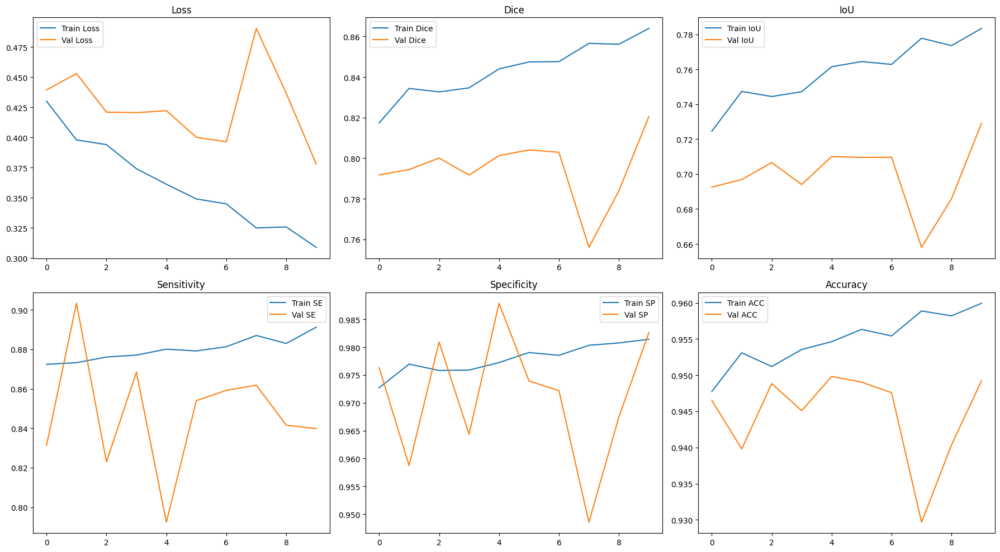


Epoch [31/40]


Train => Loss: 0.2975 | Dice: 0.8684 | IoU: 0.7903
         SE: 0.8921 | SP: 0.9823 | ACC: 0.9610
Val   => Loss: 0.3792 | Dice: 0.8151 | IoU: 0.7288
         SE: 0.8244 | SP: 0.9865 | ACC: 0.9525
----------------------------------------------------------------------

Epoch [32/40]


Train => Loss: 0.2973 | Dice: 0.8675 | IoU: 0.7908
         SE: 0.8871 | SP: 0.9832 | ACC: 0.9611
Val   => Loss: 0.3598 | Dice: 0.8251 | IoU: 0.7323
         SE: 0.8853 | SP: 0.9739 | ACC: 0.9527
----------------------------------------------------------------------

Epoch [33/40]


Train => Loss: 0.2842 | Dice: 0.8744 | IoU: 0.7970
         SE: 0.8978 | SP: 0.9823 | ACC: 0.9631
Val   => Loss: 0.4033 | Dice: 0.8031 | IoU: 0.7074
         SE: 0.9055 | SP: 0.9585 | ACC: 0.9436
----------------------------------------------------------------------

Epoch [34/40]


Train => Loss: 0.2815 | Dice: 0.8739 | IoU: 0.7984
         SE: 0.8925 | SP: 0.9832 | ACC: 0.9630
Val   => Loss: 0.4205 | Dice: 0.7994 | IoU: 0.7132
         SE: 0.7754 | SP: 0.9921 | ACC: 0.9468
----------------------------------------------------------------------

Epoch [35/40]


Train => Loss: 0.2809 | Dice: 0.8727 | IoU: 0.7959
         SE: 0.8935 | SP: 0.9822 | ACC: 0.9626
Val   => Loss: 0.3797 | Dice: 0.8025 | IoU: 0.7100
         SE: 0.8659 | SP: 0.9696 | ACC: 0.9483
----------------------------------------------------------------------

Epoch [36/40]


Train => Loss: 0.2570 | Dice: 0.8845 | IoU: 0.8110
         SE: 0.9064 | SP: 0.9829 | ACC: 0.9659
Val   => Loss: 0.3947 | Dice: 0.8083 | IoU: 0.7140
         SE: 0.8153 | SP: 0.9840 | ACC: 0.9507
----------------------------------------------------------------------

Epoch [37/40]


Train => Loss: 0.2555 | Dice: 0.8882 | IoU: 0.8153
         SE: 0.9063 | SP: 0.9835 | ACC: 0.9661
Val   => Loss: 0.3809 | Dice: 0.8082 | IoU: 0.7180
         SE: 0.8893 | SP: 0.9644 | ACC: 0.9483
----------------------------------------------------------------------

Epoch [38/40]


Train => Loss: 0.2536 | Dice: 0.8868 | IoU: 0.8150
         SE: 0.8994 | SP: 0.9858 | ACC: 0.9663
Val   => Loss: 0.3698 | Dice: 0.8196 | IoU: 0.7280
         SE: 0.8413 | SP: 0.9836 | ACC: 0.9517
----------------------------------------------------------------------

Epoch [39/40]


Train => Loss: 0.2295 | Dice: 0.8976 | IoU: 0.8291
         SE: 0.9095 | SP: 0.9862 | ACC: 0.9700
Val   => Loss: 0.3592 | Dice: 0.8164 | IoU: 0.7273
         SE: 0.8559 | SP: 0.9774 | ACC: 0.9550
----------------------------------------------------------------------

Epoch [40/40]


Train => Loss: 0.2401 | Dice: 0.8926 | IoU: 0.8222
         SE: 0.9056 | SP: 0.9850 | ACC: 0.9680
Val   => Loss: 0.3821 | Dice: 0.8060 | IoU: 0.7161
         SE: 0.8840 | SP: 0.9666 | ACC: 0.9479
----------------------------------------------------------------------
Model saved: unet_epoch_40.pth


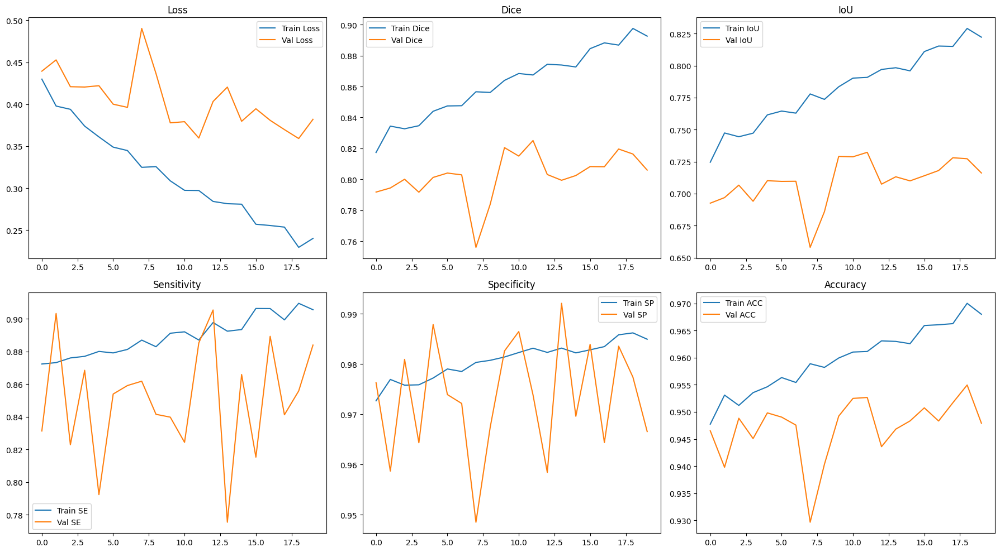


U-Net training completed. Saved as unet_final_40epochs.pth


In [40]:
# =========================
# RESUME TRAINING UNET FROM EPOCH 20 → 40
# =========================

start_epoch = 21
end_epoch   = 40   # target

# Load model
model_unet = UNet().to(device)
model_unet.load_state_dict(torch.load("/kaggle/input/unet-baseline/pytorch/default/1/unet_epoch_20.pth"))
optimizer  = torch.optim.AdamW(model_unet.parameters(), lr=1e-4)
loss_fn    = BCEDiceLoss()

print("Loaded model from epoch 20. Continuing training from epoch 21...")

# If you want to continue logging from previous lists, reload logs here.
# If not, start fresh logs for just these epochs:

train_losses = []
val_losses   = []

train_dices = []
val_dices   = []

train_ious = []
val_ious   = []

train_sens = []
val_sens   = []

train_specs = []
val_specs   = []

train_accs = []
val_accs   = []

# ========================= TRAIN LOOP =========================

for epoch in range(start_epoch, end_epoch + 1):

    print(f"\nEpoch [{epoch}/{end_epoch}]")

    # -------- Training --------
    (train_loss, train_dice, train_iou,
     train_se, train_sp, train_acc) = train_one_epoch(
        model_unet, train_loader, optimizer, loss_fn
    )

    # -------- Validation --------
    (val_loss, val_dice, val_iou,
     val_se, val_sp, val_acc) = validate_one_epoch(
        model_unet, val_loader, loss_fn
    )

    # -------- Logging --------
    train_losses.append(train_loss)
    val_losses.append(val_loss)

    train_dices.append(train_dice)
    val_dices.append(val_dice)

    train_ious.append(train_iou)
    val_ious.append(val_iou)

    train_sens.append(train_se)
    val_sens.append(val_se)

    train_specs.append(train_sp)
    val_specs.append(val_sp)

    train_accs.append(train_acc)
    val_accs.append(val_acc)

    # -------- Print summary --------
    print(f"Train => Loss: {train_loss:.4f} | Dice: {train_dice:.4f} | IoU: {train_iou:.4f}")
    print(f"         SE: {train_se:.4f} | SP: {train_sp:.4f} | ACC: {train_acc:.4f}")

    print(f"Val   => Loss: {val_loss:.4f} | Dice: {val_dice:.4f} | IoU: {val_iou:.4f}")
    print(f"         SE: {val_se:.4f} | SP: {val_sp:.4f} | ACC: {val_acc:.4f}")
    print("-" * 70)

    # -------- SAVE EVERY 10 EPOCHS (so 30 and 40) --------
    if epoch % 10 == 0:
        save_name = f"unet_epoch_{epoch}.pth"
        torch.save(model_unet.state_dict(), save_name)
        print(f"Model saved: {save_name}")

        # -------- Plot curves --------
        fig, axes = plt.subplots(2, 3, figsize=(18,10))

        axes[0,0].plot(train_losses, label="Train Loss")
        axes[0,0].plot(val_losses, label="Val Loss")
        axes[0,0].set_title("Loss"); axes[0,0].legend()

        axes[0,1].plot(train_dices, label="Train Dice")
        axes[0,1].plot(val_dices, label="Val Dice")
        axes[0,1].set_title("Dice"); axes[0,1].legend()

        axes[0,2].plot(train_ious, label="Train IoU")
        axes[0,2].plot(val_ious, label="Val IoU")
        axes[0,2].set_title("IoU"); axes[0,2].legend()

        axes[1,0].plot(train_sens, label="Train SE")
        axes[1,0].plot(val_sens, label="Val SE")
        axes[1,0].set_title("Sensitivity"); axes[1,0].legend()

        axes[1,1].plot(train_specs, label="Train SP")
        axes[1,1].plot(val_specs, label="Val SP")
        axes[1,1].set_title("Specificity"); axes[1,1].legend()

        axes[1,2].plot(train_accs, label="Train ACC")
        axes[1,2].plot(val_accs, label="Val ACC")
        axes[1,2].set_title("Accuracy"); axes[1,2].legend()

        plt.tight_layout()
        plt.show()

# =========================
# Save FINAL model
# =========================

torch.save(model_unet.state_dict(), "unet_final_40epochs.pth")
print("\nU-Net training completed. Saved as unet_final_40epochs.pth")


In [9]:
# =========================
# Evaluate Saved Model on Test Set
# =========================

# 1) Load model
model_test_unet = UNet().to(device)
model_test_unet.load_state_dict(torch.load("/kaggle/working/unet_epoch_20.pth"))
model_test_unet.eval()

print("Loaded model: unet_epoch20.pth")

# 2) Accumulators
test_loss = 0
test_dice = 0
test_iou  = 0
test_se   = 0
test_sp   = 0
test_acc  = 0

loss_fn = BCEDiceLoss()

with torch.no_grad():
    for imgs, masks in tqdm(test_loader, desc="Testing"):
        imgs = imgs.to(device)
        masks = masks.to(device)

        preds = model_test_unet(imgs)
        loss = loss_fn(preds, masks)

        test_loss += loss.item()
        test_dice += dice_coef(preds, masks).item()
        test_iou  += iou_coef(preds, masks).item()
        test_se   += sensitivity(preds, masks).item()
        test_sp   += specificity(preds, masks).item()
        test_acc  += accuracy(preds, masks).item()

# Avg over test loader
n = len(test_loader)
print("\n===== TEST RESULTS =====")
print(f"Loss: {test_loss / n:.4f}")
print(f"Dice: {test_dice / n:.4f}")
print(f"IoU : {test_iou  / n:.4f}")
print(f"Sensitivity (SE): {test_se / n:.4f}")
print(f"Specificity (SP): {test_sp / n:.4f}")
print(f"Accuracy        : {test_acc / n:.4f}")
print("========================")


Loaded model: unet_epoch20.pth


Testing: 100%|██████████| 7/7 [00:03<00:00,  2.26it/s]


===== TEST RESULTS =====
Loss: 0.5086
Dice: 0.8040
IoU : 0.7090
Sensitivity (SE): 0.8020
Specificity (SP): 0.9839
Accuracy        : 0.9297


In [42]:
# =========================
# Evaluate Saved Model on Test Set
# =========================

# 1) Load model
model_test_unet = UNet().to(device)
model_test_unet.load_state_dict(torch.load("/kaggle/working/unet_epoch_40.pth"))
model_test_unet.eval()

print("Loaded model: unet_epoch20.pth")

# 2) Accumulators
test_loss = 0
test_dice = 0
test_iou  = 0
test_se   = 0
test_sp   = 0
test_acc  = 0

loss_fn = BCEDiceLoss()

with torch.no_grad():
    for imgs, masks in tqdm(test_loader, desc="Testing"):
        imgs = imgs.to(device)
        masks = masks.to(device)

        preds = model_test_unet(imgs)
        loss = loss_fn(preds, masks)

        test_loss += loss.item()
        test_dice += dice_coef(preds, masks).item()
        test_iou  += iou_coef(preds, masks).item()
        test_se   += sensitivity(preds, masks).item()
        test_sp   += specificity(preds, masks).item()
        test_acc  += accuracy(preds, masks).item()

# Avg over test loader
n = len(test_loader)
print("\n===== TEST RESULTS =====")
print(f"Loss: {test_loss / n:.4f}")
print(f"Dice: {test_dice / n:.4f}")
print(f"IoU : {test_iou  / n:.4f}")
print(f"Sensitivity (SE): {test_se / n:.4f}")
print(f"Specificity (SP): {test_sp / n:.4f}")
print(f"Accuracy        : {test_acc / n:.4f}")
print("========================")


Loaded model: unet_epoch20.pth


Testing: 100%|██████████| 7/7 [00:02<00:00,  2.46it/s]


===== TEST RESULTS =====
Loss: 0.3749
Dice: 0.8390
IoU : 0.7536
Sensitivity (SE): 0.8848
Specificity (SP): 0.9565
Accuracy        : 0.9403


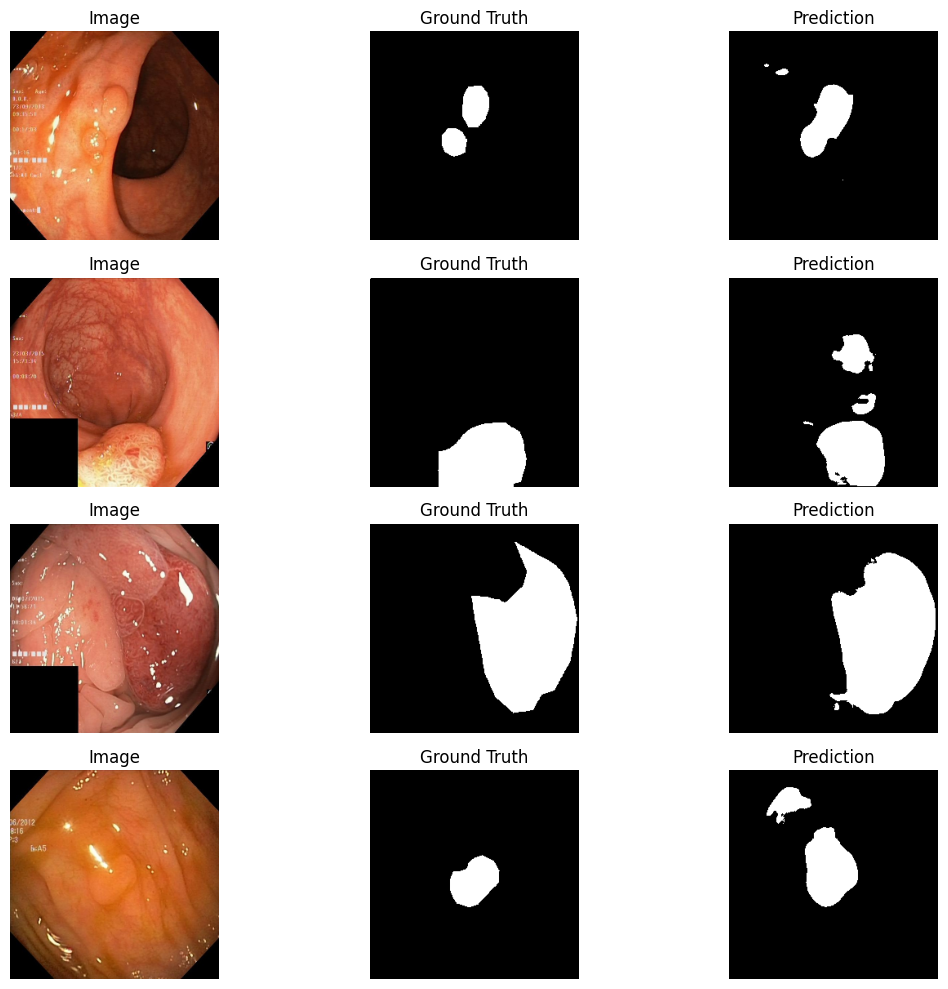

In [10]:
# =========================
# Visualize some test predictions
# =========================

model_test_unet.eval()
imgs, masks = next(iter(test_loader))
imgs = imgs.to(device)
masks = masks.to(device)

with torch.no_grad():
    preds = torch.sigmoid(model_test_unet(imgs))
    preds = (preds > 0.5).float()

plt.figure(figsize=(12, 10))
for i in range(4):
    img = imgs[i].permute(1,2,0).cpu().numpy()
    if img.max() > 1: img /= 255.0  # for valid imshow

    mask_gt = masks[i,0].cpu().numpy()
    mask_pr = preds[i,0].cpu().numpy()

    plt.subplot(4,3,3*i+1); plt.imshow(img); plt.title("Image"); plt.axis("off")
    plt.subplot(4,3,3*i+2); plt.imshow(mask_gt, cmap="gray"); plt.title("Ground Truth"); plt.axis("off")
    plt.subplot(4,3,3*i+3); plt.imshow(mask_pr, cmap="gray"); plt.title("Prediction"); plt.axis("off")

plt.tight_layout()
plt.show()


# Hybrid Vit + Innovative Fusion

In [41]:
# =========================
# Step 6: Edge Encoder (CNN Branch)
# =========================

import torch.nn as nn

class ConvBlock(nn.Module):
    """
    Basic conv block used in the Edge Encoder.
    Lighter than U-Net's DoubleConv.
    """
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.net(x)


class EdgeEncoder(nn.Module):
    """
    Lightweight CNN encoder to extract boundary-focused features.
    Produces multi-scale features: E1, E2, E3, E4
    """
    def __init__(self, in_channels=3, feature_sizes=[32, 64, 128, 256]):
        super().__init__()

        self.enc1 = ConvBlock(in_channels, feature_sizes[0])
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = ConvBlock(feature_sizes[0], feature_sizes[1])
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = ConvBlock(feature_sizes[1], feature_sizes[2])
        self.pool3 = nn.MaxPool2d(2)

        self.enc4 = ConvBlock(feature_sizes[2], feature_sizes[3])

    def forward(self, x):
        E1 = self.enc1(x)          # 1/2
        x = self.pool1(E1)

        E2 = self.enc2(x)          # 1/4
        x = self.pool2(E2)

        E3 = self.enc3(x)          # 1/8
        x = self.pool3(E3)

        E4 = self.enc4(x)          # 1/16

        return E1, E2, E3, E4


In [42]:
# =========================
# Step 7: Body Encoder (Transformer Branch)
# =========================

class BodyEncoder(nn.Module):
    """
    Transformer-based encoder using Swin-Tiny from timm.
    Outputs multi-scale features: B1, B2, B3, B4
    """
    def __init__(self, model_name="swin_tiny_patch4_window7_224", pretrained=True):
        super().__init__()
        # features_only=True gives us intermediate feature maps
        self.backbone = timm.create_model(
            model_name,
            pretrained=pretrained,
            img_size=256,
            features_only=True,
            out_indices=(0, 1, 2, 3)
        )
        # Channels at each stage: e.g. [96, 192, 384, 768] for swin_tiny
        self.out_channels = self.backbone.feature_info.channels()

    def forward(self, x):
        # backbone returns a list of 4 feature maps
        feats = self.backbone(x)
        B1, B2, B3, B4 = feats
        return B1, B2, B3, B4


In [43]:
# Optional sanity check
dummy = torch.randn(1, 3, CFG.img_size[0], CFG.img_size[1]).to(device)
edge_enc = EdgeEncoder().to(device)
body_enc = BodyEncoder().to(device)

with torch.no_grad():
    E1, E2, E3, E4 = edge_enc(dummy)
    B1, B2, B3, B4 = body_enc(dummy)

print("Edge shapes:", E1.shape, E2.shape, E3.shape, E4.shape)
print("Body shapes:", B1.shape, B2.shape, B3.shape, B4.shape)


Edge shapes: torch.Size([1, 32, 256, 256]) torch.Size([1, 64, 128, 128]) torch.Size([1, 128, 64, 64]) torch.Size([1, 256, 32, 32])
Body shapes: torch.Size([1, 64, 64, 96]) torch.Size([1, 32, 32, 192]) torch.Size([1, 16, 16, 384]) torch.Size([1, 8, 8, 768])


In [44]:
# =========================
# Step 8: Edge-Gated Fusion (EGF)
# =========================

import torch.nn.functional as F

class EdgeGatedFusion(nn.Module):
    """
    EGF: Fuses edge (Ei) and body (Bi) features.
    Handles:
    - spatial alignment
    - channel alignment
    - gating
    """
    def __init__(self, edge_ch, body_ch, fused_ch):
        super().__init__()

        # Align channels to fused_ch
        self.edge_proj = nn.Conv2d(edge_ch, fused_ch, kernel_size=1)
        self.body_proj = nn.Conv2d(body_ch, fused_ch, kernel_size=1)

        # Gate layer outputs 1-channel map (for α)
        self.gate = nn.Sequential(
            nn.Conv2d(fused_ch * 2, fused_ch, kernel_size=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(fused_ch, 1, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, Ei, Bi):
        # Step 1: spatial align Bi to Ei
        Bi = F.interpolate(Bi, size=Ei.shape[2:], mode='bilinear', align_corners=False)

        # Step 2: channel projections
        Ei_p = self.edge_proj(Ei)
        Bi_p = self.body_proj(Bi)

        # Step 3: compute α gate
        concat = torch.cat([Ei_p, Bi_p], dim=1)  # (b, 2*fused_ch, h, w)
        alpha = self.gate(concat)                # (b, 1, h, w)

        # Step 4: fusion
        Fused = alpha * Ei_p + (1 - alpha) * Bi_p
        return Fused


In [45]:
# =========================
# Sanity Check for Step 8 (EGF Fusion)
# =========================

dummy = torch.randn(1, 3, 256, 256).to(device)

edge = EdgeEncoder().to(device)
body = BodyEncoder().to(device)

E1, E2, E3, E4 = edge(dummy)
B1, B2, B3, B4 = body(dummy)

print("Edge shapes:", E1.shape, E2.shape, E3.shape, E4.shape)
print("Body shapes:", B1.shape, B2.shape, B3.shape, B4.shape)

# Instantiate EGF modules (must match your channel sizes!)
EGF1 = EdgeGatedFusion(edge_ch=32,  body_ch=64, fused_ch=64).to(device)
EGF2 = EdgeGatedFusion(edge_ch=64,  body_ch=32, fused_ch=64).to(device)
EGF3 = EdgeGatedFusion(edge_ch=128, body_ch=16, fused_ch=128).to(device)
EGF4 = EdgeGatedFusion(edge_ch=256, body_ch=8,  fused_ch=256).to(device)

F1 = EGF1(E1, B1)
F2 = EGF2(E2, B2)
F3 = EGF3(E3, B3)
F4 = EGF4(E4, B4)

print("\nFUSED FEATURE SHAPES:")
print("F1:", F1.shape)   # expect (1, 64, 256, 256)
print("F2:", F2.shape)   # expect (1, 64, 128, 128)
print("F3:", F3.shape)   # expect (1,128,  64,  64)
print("F4:", F4.shape)   # expect (1,256,  32,  32)


Edge shapes: torch.Size([1, 32, 256, 256]) torch.Size([1, 64, 128, 128]) torch.Size([1, 128, 64, 64]) torch.Size([1, 256, 32, 32])
Body shapes: torch.Size([1, 64, 64, 96]) torch.Size([1, 32, 32, 192]) torch.Size([1, 16, 16, 384]) torch.Size([1, 8, 8, 768])

FUSED FEATURE SHAPES:
F1: torch.Size([1, 64, 256, 256])
F2: torch.Size([1, 64, 128, 128])
F3: torch.Size([1, 128, 64, 64])
F4: torch.Size([1, 256, 32, 32])


In [46]:
# =========================
# LCAF: Local Context Aggregation Fusion
# =========================
import torch.nn.functional as F
class LCAF(nn.Module):
    """
    LCAF: Uses local context (3×3 conv) to extract complementary features.
    """
    def __init__(self, edge_ch, body_ch, fused_ch):
        super().__init__()

        # Spatial alignment convs
        self.edge_proj = nn.Conv2d(edge_ch, fused_ch, kernel_size=3, padding=1)
        self.body_proj = nn.Conv2d(body_ch, fused_ch, kernel_size=3, padding=1)

        # Local context mixing
        self.local_ctx = nn.Sequential(
            nn.Conv2d(fused_ch * 2, fused_ch, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(fused_ch, fused_ch, 3, padding=1)
        )

    def forward(self, Ei, Bi):
        Bi = F.interpolate(Bi, size=Ei.shape[2:], mode="bilinear", align_corners=False)

        Ei_p = self.edge_proj(Ei)
        Bi_p = self.body_proj(Bi)

        fuse = torch.cat([Ei_p, Bi_p], dim=1)
        out = self.local_ctx(fuse)
        return out


# =========================
# DLF: Dual-Level Fusion
# =========================

class DLF(nn.Module):
    """
    DLF: Combines low-level + high-level fusion using:
         - multiplicative enhancement
         - additive residual
    """
    def __init__(self, edge_ch, body_ch, fused_ch):
        super().__init__()

        self.edge_proj = nn.Conv2d(edge_ch, fused_ch, 1)
        self.body_proj = nn.Conv2d(body_ch, fused_ch, 1)

        # High-level fusion
        self.high_fuse = nn.Sequential(
            nn.Conv2d(fused_ch, fused_ch, 3, padding=1),
            nn.ReLU(inplace=True)
        )

        # Final mix
        self.out_conv = nn.Conv2d(fused_ch, fused_ch, 1)

    def forward(self, Ei, Bi):
        Bi = F.interpolate(Bi, size=Ei.shape[2:], mode='bilinear', align_corners=False)

        Ei_p = self.edge_proj(Ei)
        Bi_p = self.body_proj(Bi)

        # Dual-level (multiplicative + additive)
        mul = Ei_p * Bi_p
        add = Ei_p + Bi_p

        high = self.high_fuse(add + mul)
        out = self.out_conv(high)

        return out


In [47]:
class LCAF_DLF(nn.Module):
    """
    BEFUnet paper uses LCAF first, then DLF.
    """
    def __init__(self, edge_ch, body_ch, fused_ch):
        super().__init__()

        self.lcaf = LCAF(edge_ch, body_ch, fused_ch)
        self.dlf = DLF(fused_ch, fused_ch, fused_ch)   # both inputs already fused_ch

    def forward(self, Ei, Bi):
        x = self.lcaf(Ei, Bi)
        x = self.dlf(x, x)   # DLF normally fuses two high-level features;
                             # in BEFUnet it refines the LCAF output
        return x


In [76]:
# =========================
# Step 9: Decoder + Full BEFUnet Model
# =========================

class UpBlock(nn.Module):
    """
    Basic upsample block: upsample -> convblock
    """
    def __init__(self, in_ch, skip_ch, out_ch):
        super().__init__()
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch + skip_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),

            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def forward(self, x, skip):
        x = self.up(x)
        # match resolution to skip (safety)
        if x.shape[-2:] != skip.shape[-2:]:
            x = F.interpolate(x, size=skip.shape[-2:], mode='bilinear', align_corners=False)

        x = torch.cat([x, skip], dim=1)
        return self.conv(x)


class BEFUnet(nn.Module):
    """
    Full hybrid model:
    - Edge Encoder
    - Body Encoder (Swin)
    - EGF Fusion
    - Decoder
    """
    def __init__(self):
        super().__init__()

        # ---- Encoders ----
        self.edge_encoder = EdgeEncoder()
        self.body_encoder = BodyEncoder()

        # Body channels from swin
        b_ch = self.body_encoder.out_channels  # e.g. [64,32,16,8]

        
        # ---- Fusion modules ----
        self.fuse1 = LCAF_DLF(32, 64, 64)
        self.fuse2 = LCAF_DLF(64, 32, 64)
        self.fuse3 = LCAF_DLF(128, 16, 128)
        self.fuse4 = LCAF_DLF(256, 8,  256)



        # ---- Decoder ----
        self.up4 = UpBlock(in_ch=256, skip_ch=128, out_ch=128)  # F4 + F3
        self.up3 = UpBlock(in_ch=128, skip_ch=64,  out_ch=64)   # F3 + F2
        self.up2 = UpBlock(in_ch=64,  skip_ch=64,  out_ch=64)   # F2 + F1
        self.up1 = nn.Sequential(
            nn.Conv2d(64, 32, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 1, 1)  # final mask
        )

    def forward(self, x):
        # ---- Edge encoder ----
        E1, E2, E3, E4 = self.edge_encoder(x)

        # ---- Body encoder ----
        B1, B2, B3, B4 = self.body_encoder(x)

        # ---- EGF Fusion ----
        F1 = self.fuse1(E1, B1)
        F2 = self.fuse2(E2, B2)
        F3 = self.fuse3(E3, B3)
        F4 = self.fuse4(E4, B4)


        # ---- Decoder ----
        D4 = self.up4(F4, F3)
        D3 = self.up3(D4, F2)
        D2 = self.up2(D3, F1)
        out = self.up1(D2)

        return out


In [77]:
model_befunet = BEFUnet().to(device)
dummy = torch.randn(1,3,256,256).to(device)

with torch.no_grad():
    out = model_befunet(dummy)

print("Output:", out.shape)


Output: torch.Size([1, 1, 256, 256])


In [78]:
model_befunet = BEFUnet().to(device)
optimizer = torch.optim.AdamW(model_befunet.parameters(), lr=1e-4)
loss_fn = BCEDiceLoss()

In [19]:
# =========================
# BEFUnet Sanity Training (1 epoch)
# =========================

model_befunet = BEFUnet().to(device)
optimizer = torch.optim.AdamW(model_befunet.parameters(), lr=1e-4)
loss_fn = BCEDiceLoss()

print("\n=== SANITY CHECK: 1 EPOCH TRAINING FOR BEFUnet ===")

# ---- Training ----
(train_loss, train_dice, train_iou,
 train_se, train_sp, train_acc) = train_one_epoch(
    model_befunet, train_loader, optimizer, loss_fn
)

# ---- Validation ----
(val_loss, val_dice, val_iou,
 val_se, val_sp, val_acc) = validate_one_epoch(
    model_befunet, val_loader, loss_fn
)

print("\n===== SANITY CHECK RESULTS =====")
print(f"Train Loss: {train_loss:.4f} | Dice: {train_dice:.4f} | IoU: {train_iou:.4f}")
print(f"Train SE: {train_se:.4f} | SP: {train_sp:.4f} | ACC: {train_acc:.4f}")
print("-----------------------------------------------------------")
print(f"Val Loss:   {val_loss:.4f} | Dice: {val_dice:.4f} | IoU: {val_iou:.4f}")
print(f"Val SE: {val_se:.4f} | SP: {val_sp:.4f} | ACC: {val_acc:.4f}")
print("===============================================")



=== SANITY CHECK: 1 EPOCH TRAINING FOR BEFUnet ===



===== SANITY CHECK RESULTS =====
Train Loss: 1.1562 | Dice: 0.2509 | IoU: 0.1778
Train SE: 0.3073 | SP: 0.9496 | ACC: 0.8424
-----------------------------------------------------------
Val Loss:   0.9622 | Dice: 0.5234 | IoU: 0.3964
Val SE: 0.6273 | SP: 0.9089 | ACC: 0.8561



Epoch [1/40]


Train => Loss: 1.1890 | Dice: 0.4252 | IoU: 0.3008
         SE: 0.7045 | SP: 0.7723 | ACC: 0.7485
Val   => Loss: 0.9756 | Dice: 0.5314 | IoU: 0.3957
         SE: 0.7135 | SP: 0.8732 | ACC: 0.8366
----------------------------------------------------------------------

Epoch [2/40]


Train => Loss: 0.9409 | Dice: 0.4806 | IoU: 0.3497
         SE: 0.5966 | SP: 0.9129 | ACC: 0.8520
Val   => Loss: 0.8625 | Dice: 0.5102 | IoU: 0.3804
         SE: 0.5297 | SP: 0.9548 | ACC: 0.8790
----------------------------------------------------------------------

Epoch [3/40]


Train => Loss: 0.8754 | Dice: 0.5121 | IoU: 0.3793
         SE: 0.6088 | SP: 0.9259 | ACC: 0.8662
Val   => Loss: 0.8068 | Dice: 0.5582 | IoU: 0.4217
         SE: 0.5963 | SP: 0.9505 | ACC: 0.8845
----------------------------------------------------------------------

Epoch [4/40]


Train => Loss: 0.8387 | Dice: 0.5381 | IoU: 0.4026
         SE: 0.6405 | SP: 0.9283 | ACC: 0.8721
Val   => Loss: 0.7371 | Dice: 0.6110 | IoU: 0.4796
         SE: 0.7234 | SP: 0.9289 | ACC: 0.8864
----------------------------------------------------------------------

Epoch [5/40]


Train => Loss: 0.7912 | Dice: 0.5667 | IoU: 0.4339
         SE: 0.6564 | SP: 0.9372 | ACC: 0.8834
Val   => Loss: 0.7212 | Dice: 0.6270 | IoU: 0.4940
         SE: 0.6868 | SP: 0.9515 | ACC: 0.8972
----------------------------------------------------------------------

Epoch [6/40]


Train => Loss: 0.7623 | Dice: 0.5915 | IoU: 0.4574
         SE: 0.6889 | SP: 0.9391 | ACC: 0.8877
Val   => Loss: 0.7593 | Dice: 0.5731 | IoU: 0.4524
         SE: 0.6293 | SP: 0.9471 | ACC: 0.8895
----------------------------------------------------------------------

Epoch [7/40]


Train => Loss: 0.7378 | Dice: 0.6041 | IoU: 0.4703
         SE: 0.6830 | SP: 0.9458 | ACC: 0.8931
Val   => Loss: 0.7829 | Dice: 0.6075 | IoU: 0.4738
         SE: 0.8610 | SP: 0.8705 | ACC: 0.8567
----------------------------------------------------------------------

Epoch [8/40]


Train => Loss: 0.7075 | Dice: 0.6255 | IoU: 0.4950
         SE: 0.6953 | SP: 0.9496 | ACC: 0.8995
Val   => Loss: 0.6561 | Dice: 0.6532 | IoU: 0.5291
         SE: 0.6849 | SP: 0.9669 | ACC: 0.9088
----------------------------------------------------------------------

Epoch [9/40]


Train => Loss: 0.6774 | Dice: 0.6456 | IoU: 0.5156
         SE: 0.7187 | SP: 0.9514 | ACC: 0.9031
Val   => Loss: 0.6576 | Dice: 0.6489 | IoU: 0.5256
         SE: 0.6617 | SP: 0.9674 | ACC: 0.9097
----------------------------------------------------------------------

Epoch [10/40]


Train => Loss: 0.6382 | Dice: 0.6690 | IoU: 0.5432
         SE: 0.7302 | SP: 0.9575 | ACC: 0.9103
Val   => Loss: 0.5828 | Dice: 0.6976 | IoU: 0.5786
         SE: 0.7584 | SP: 0.9600 | ACC: 0.9183
----------------------------------------------------------------------


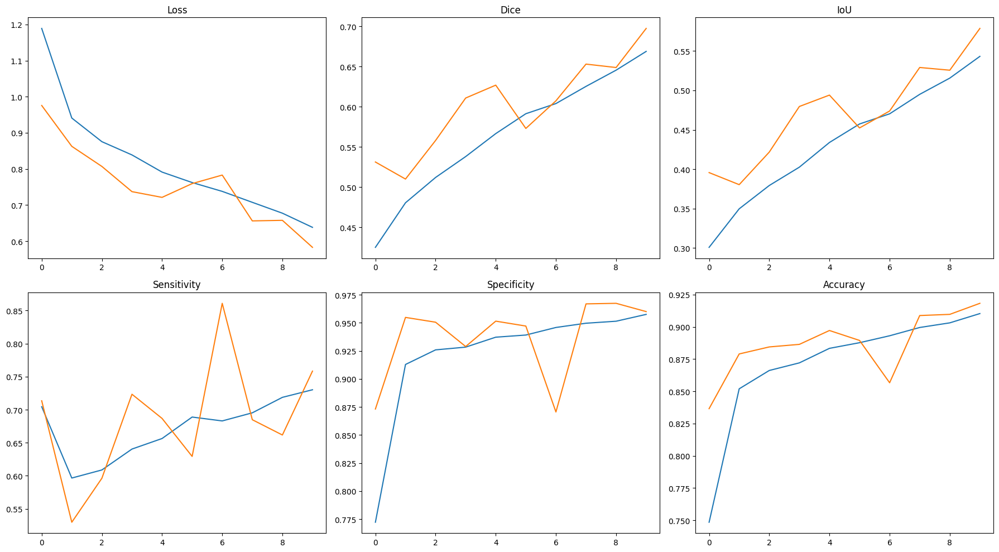

Saved checkpoint: befunet_epoch10.pth

Epoch [11/40]


Train => Loss: 0.6150 | Dice: 0.6801 | IoU: 0.5535
         SE: 0.7399 | SP: 0.9583 | ACC: 0.9134
Val   => Loss: 0.6771 | Dice: 0.6226 | IoU: 0.5041
         SE: 0.6037 | SP: 0.9813 | ACC: 0.9124
----------------------------------------------------------------------

Epoch [12/40]


Train => Loss: 0.6075 | Dice: 0.6850 | IoU: 0.5614
         SE: 0.7468 | SP: 0.9579 | ACC: 0.9140
Val   => Loss: 0.6414 | Dice: 0.6662 | IoU: 0.5480
         SE: 0.6290 | SP: 0.9850 | ACC: 0.9175
----------------------------------------------------------------------

Epoch [13/40]


Train => Loss: 0.5761 | Dice: 0.7069 | IoU: 0.5844
         SE: 0.7604 | SP: 0.9625 | ACC: 0.9198
Val   => Loss: 0.5822 | Dice: 0.6990 | IoU: 0.5859
         SE: 0.6839 | SP: 0.9819 | ACC: 0.9230
----------------------------------------------------------------------

Epoch [14/40]


Train => Loss: 0.5609 | Dice: 0.7189 | IoU: 0.5970
         SE: 0.7655 | SP: 0.9647 | ACC: 0.9221
Val   => Loss: 0.5527 | Dice: 0.7197 | IoU: 0.5978
         SE: 0.7848 | SP: 0.9616 | ACC: 0.9235
----------------------------------------------------------------------

Epoch [15/40]


Train => Loss: 0.5383 | Dice: 0.7275 | IoU: 0.6081
         SE: 0.7778 | SP: 0.9639 | ACC: 0.9249
Val   => Loss: 0.5252 | Dice: 0.7306 | IoU: 0.6184
         SE: 0.8095 | SP: 0.9572 | ACC: 0.9237
----------------------------------------------------------------------

Epoch [16/40]


Train => Loss: 0.5003 | Dice: 0.7507 | IoU: 0.6343
         SE: 0.7937 | SP: 0.9655 | ACC: 0.9302
Val   => Loss: 0.5763 | Dice: 0.7093 | IoU: 0.5968
         SE: 0.6885 | SP: 0.9830 | ACC: 0.9257
----------------------------------------------------------------------

Epoch [17/40]


Train => Loss: 0.4908 | Dice: 0.7530 | IoU: 0.6403
         SE: 0.7946 | SP: 0.9666 | ACC: 0.9317
Val   => Loss: 0.5279 | Dice: 0.7284 | IoU: 0.6159
         SE: 0.7206 | SP: 0.9830 | ACC: 0.9291
----------------------------------------------------------------------

Epoch [18/40]


Train => Loss: 0.4725 | Dice: 0.7632 | IoU: 0.6524
         SE: 0.7974 | SP: 0.9688 | ACC: 0.9344
Val   => Loss: 0.5026 | Dice: 0.7494 | IoU: 0.6406
         SE: 0.7714 | SP: 0.9703 | ACC: 0.9316
----------------------------------------------------------------------

Epoch [19/40]


Train => Loss: 0.4704 | Dice: 0.7653 | IoU: 0.6552
         SE: 0.8022 | SP: 0.9689 | ACC: 0.9344
Val   => Loss: 0.5307 | Dice: 0.7308 | IoU: 0.6161
         SE: 0.7109 | SP: 0.9829 | ACC: 0.9301
----------------------------------------------------------------------

Epoch [20/40]


Train => Loss: 0.4411 | Dice: 0.7780 | IoU: 0.6698
         SE: 0.8093 | SP: 0.9689 | ACC: 0.9376
Val   => Loss: 0.4941 | Dice: 0.7424 | IoU: 0.6354
         SE: 0.7952 | SP: 0.9637 | ACC: 0.9307
----------------------------------------------------------------------


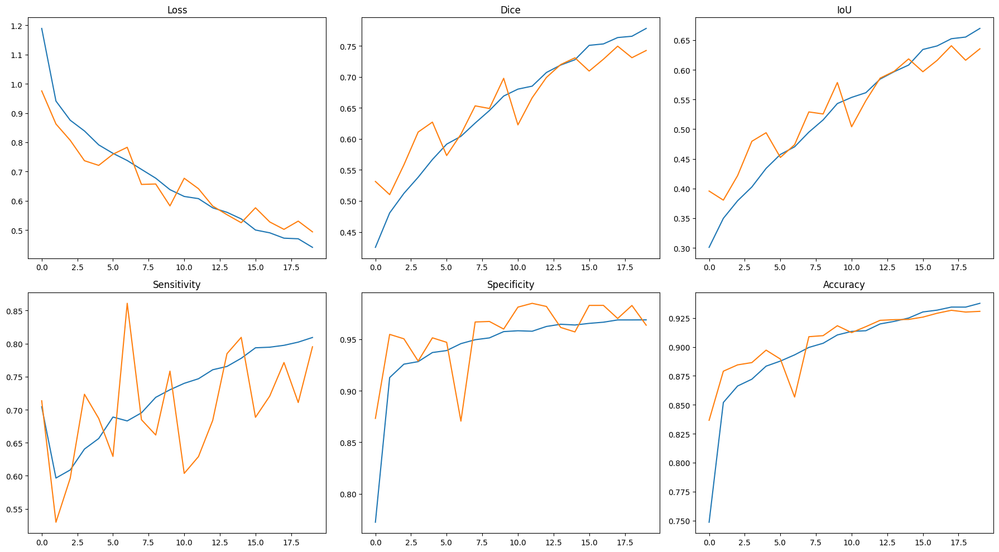

Saved checkpoint: befunet_epoch20.pth

Epoch [21/40]


Train => Loss: 0.4182 | Dice: 0.7889 | IoU: 0.6832
         SE: 0.8159 | SP: 0.9723 | ACC: 0.9428
Val   => Loss: 0.5214 | Dice: 0.7299 | IoU: 0.6224
         SE: 0.7421 | SP: 0.9768 | ACC: 0.9318
----------------------------------------------------------------------

Epoch [22/40]


Train => Loss: 0.4001 | Dice: 0.8002 | IoU: 0.6984
         SE: 0.8296 | SP: 0.9708 | ACC: 0.9441
Val   => Loss: 0.5048 | Dice: 0.7513 | IoU: 0.6429
         SE: 0.8548 | SP: 0.9468 | ACC: 0.9224
----------------------------------------------------------------------

Epoch [23/40]


Train => Loss: 0.3908 | Dice: 0.8038 | IoU: 0.7032
         SE: 0.8248 | SP: 0.9735 | ACC: 0.9461
Val   => Loss: 0.5153 | Dice: 0.7480 | IoU: 0.6463
         SE: 0.7459 | SP: 0.9845 | ACC: 0.9359
----------------------------------------------------------------------

Epoch [24/40]


Train => Loss: 0.3635 | Dice: 0.8179 | IoU: 0.7192
         SE: 0.8420 | SP: 0.9722 | ACC: 0.9491
Val   => Loss: 0.5193 | Dice: 0.7381 | IoU: 0.6327
         SE: 0.7059 | SP: 0.9872 | ACC: 0.9355
----------------------------------------------------------------------

Epoch [25/40]


Train => Loss: 0.3458 | Dice: 0.8288 | IoU: 0.7333
         SE: 0.8566 | SP: 0.9726 | ACC: 0.9516
Val   => Loss: 0.5555 | Dice: 0.7219 | IoU: 0.6165
         SE: 0.6768 | SP: 0.9888 | ACC: 0.9322
----------------------------------------------------------------------

Epoch [26/40]


Train => Loss: 0.3550 | Dice: 0.8195 | IoU: 0.7240
         SE: 0.8380 | SP: 0.9741 | ACC: 0.9507
Val   => Loss: 0.5807 | Dice: 0.7012 | IoU: 0.5969
         SE: 0.6371 | SP: 0.9937 | ACC: 0.9295
----------------------------------------------------------------------

Epoch [27/40]


Train => Loss: 0.3280 | Dice: 0.8372 | IoU: 0.7458
         SE: 0.8575 | SP: 0.9741 | ACC: 0.9540
Val   => Loss: 0.5544 | Dice: 0.7226 | IoU: 0.6179
         SE: 0.6713 | SP: 0.9900 | ACC: 0.9318
----------------------------------------------------------------------

Epoch [28/40]


Train => Loss: 0.3186 | Dice: 0.8382 | IoU: 0.7474
         SE: 0.8494 | SP: 0.9776 | ACC: 0.9566
Val   => Loss: 0.4717 | Dice: 0.7620 | IoU: 0.6575
         SE: 0.8098 | SP: 0.9661 | ACC: 0.9340
----------------------------------------------------------------------

Epoch [29/40]


Train => Loss: 0.2934 | Dice: 0.8523 | IoU: 0.7654
         SE: 0.8675 | SP: 0.9761 | ACC: 0.9593
Val   => Loss: 0.4978 | Dice: 0.7630 | IoU: 0.6578
         SE: 0.7410 | SP: 0.9835 | ACC: 0.9381
----------------------------------------------------------------------

Epoch [30/40]


Train => Loss: 0.2782 | Dice: 0.8604 | IoU: 0.7747
         SE: 0.8711 | SP: 0.9779 | ACC: 0.9613
Val   => Loss: 0.4475 | Dice: 0.7776 | IoU: 0.6777
         SE: 0.8126 | SP: 0.9741 | ACC: 0.9418
----------------------------------------------------------------------


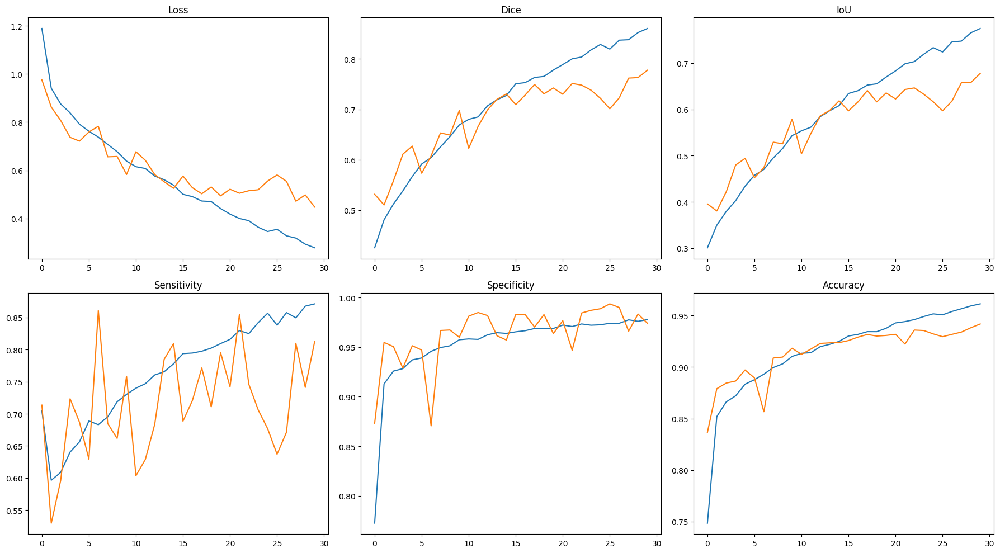

Saved checkpoint: befunet_epoch30.pth

Epoch [31/40]


Train => Loss: 0.2883 | Dice: 0.8558 | IoU: 0.7696
         SE: 0.8735 | SP: 0.9767 | ACC: 0.9593
Val   => Loss: 0.4728 | Dice: 0.7677 | IoU: 0.6684
         SE: 0.8082 | SP: 0.9661 | ACC: 0.9361
----------------------------------------------------------------------

Epoch [32/40]


Train => Loss: 0.2971 | Dice: 0.8506 | IoU: 0.7624
         SE: 0.8686 | SP: 0.9763 | ACC: 0.9584
Val   => Loss: 0.4435 | Dice: 0.7857 | IoU: 0.6858
         SE: 0.8058 | SP: 0.9748 | ACC: 0.9397
----------------------------------------------------------------------

Epoch [33/40]


Train => Loss: 0.2763 | Dice: 0.8595 | IoU: 0.7745
         SE: 0.8715 | SP: 0.9799 | ACC: 0.9628
Val   => Loss: 0.4644 | Dice: 0.7693 | IoU: 0.6673
         SE: 0.8284 | SP: 0.9621 | ACC: 0.9352
----------------------------------------------------------------------

Epoch [34/40]


Train => Loss: 0.2475 | Dice: 0.8752 | IoU: 0.7950
         SE: 0.8871 | SP: 0.9804 | ACC: 0.9657
Val   => Loss: 0.4731 | Dice: 0.7723 | IoU: 0.6729
         SE: 0.7976 | SP: 0.9759 | ACC: 0.9414
----------------------------------------------------------------------

Epoch [35/40]


Train => Loss: 0.2401 | Dice: 0.8793 | IoU: 0.8007
         SE: 0.8905 | SP: 0.9802 | ACC: 0.9668
Val   => Loss: 0.4541 | Dice: 0.7770 | IoU: 0.6769
         SE: 0.8005 | SP: 0.9719 | ACC: 0.9395
----------------------------------------------------------------------

Epoch [36/40]


Train => Loss: 0.2380 | Dice: 0.8797 | IoU: 0.8025
         SE: 0.8867 | SP: 0.9819 | ACC: 0.9680
Val   => Loss: 0.4501 | Dice: 0.7786 | IoU: 0.6764
         SE: 0.8275 | SP: 0.9677 | ACC: 0.9396
----------------------------------------------------------------------

Epoch [37/40]


Train => Loss: 0.2303 | Dice: 0.8849 | IoU: 0.8091
         SE: 0.8953 | SP: 0.9813 | ACC: 0.9681
Val   => Loss: 0.4575 | Dice: 0.7738 | IoU: 0.6713
         SE: 0.7690 | SP: 0.9804 | ACC: 0.9409
----------------------------------------------------------------------

Epoch [38/40]


Train => Loss: 0.2124 | Dice: 0.8910 | IoU: 0.8181
         SE: 0.9000 | SP: 0.9816 | ACC: 0.9705
Val   => Loss: 0.4857 | Dice: 0.7716 | IoU: 0.6737
         SE: 0.7429 | SP: 0.9874 | ACC: 0.9422
----------------------------------------------------------------------

Epoch [39/40]


Train => Loss: 0.2206 | Dice: 0.8891 | IoU: 0.8155
         SE: 0.8983 | SP: 0.9820 | ACC: 0.9696
Val   => Loss: 0.4730 | Dice: 0.7778 | IoU: 0.6734
         SE: 0.8130 | SP: 0.9712 | ACC: 0.9369
----------------------------------------------------------------------

Epoch [40/40]


Train => Loss: 0.2132 | Dice: 0.8915 | IoU: 0.8196
         SE: 0.9025 | SP: 0.9826 | ACC: 0.9708
Val   => Loss: 0.4945 | Dice: 0.7750 | IoU: 0.6745
         SE: 0.7518 | SP: 0.9861 | ACC: 0.9398
----------------------------------------------------------------------


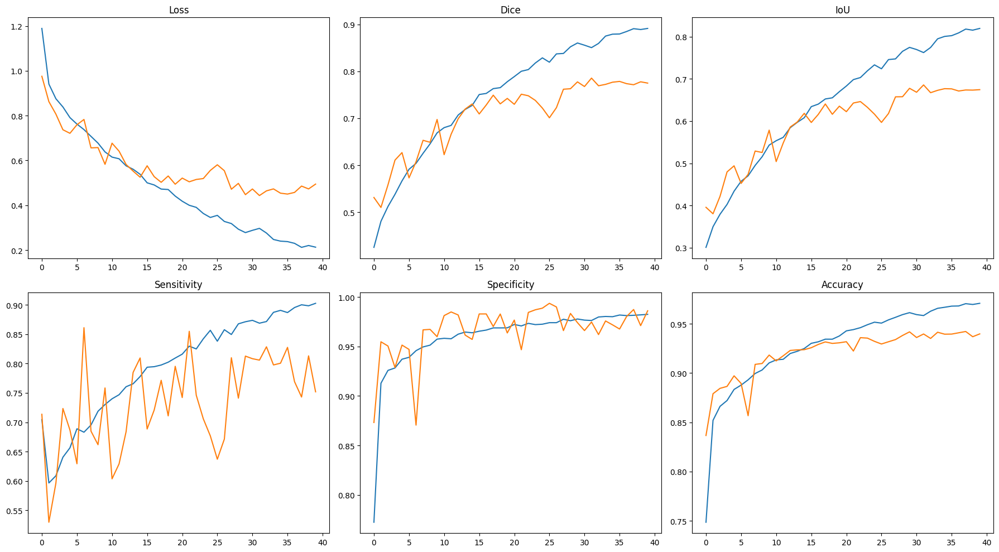

Saved checkpoint: befunet_epoch40.pth
Saved final model: befunet_final_40epochs.pth


In [29]:
# =========================
# Step 10: Train BEFUnet Hybrid Model
# =========================

model_befunet = BEFUnet().to(device)
optimizer = torch.optim.AdamW(model_befunet.parameters(), lr=1e-4)
loss_fn = BCEDiceLoss()

num_epochs = 40

# Logs
train_losses = []
val_losses   = []

train_dices = []
val_dices   = []

train_ious = []
val_ious   = []

train_sens = []
val_sens   = []

train_specs = []
val_specs   = []

train_accs = []
val_accs   = []

for epoch in range(1, num_epochs + 1):
    print(f"\nEpoch [{epoch}/{num_epochs}]")

    # ---- Training ----
    (train_loss, train_dice, train_iou,
     train_se, train_sp, train_acc) = train_one_epoch(
        model_befunet, train_loader, optimizer, loss_fn
    )

    # ---- Validation ----
    (val_loss, val_dice, val_iou,
     val_se, val_sp, val_acc) = validate_one_epoch(
        model_befunet, val_loader, loss_fn
    )

    # ---- Store logs ----
    train_losses.append(train_loss)
    val_losses.append(val_loss)

    train_dices.append(train_dice)
    val_dices.append(val_dice)

    train_ious.append(train_iou)
    val_ious.append(val_iou)

    train_sens.append(train_se)
    val_sens.append(val_se)

    train_specs.append(train_sp)
    val_specs.append(val_sp)

    train_accs.append(train_acc)
    val_accs.append(val_acc)

    # ---- Print epoch summary ----
    print(f"Train => Loss: {train_loss:.4f} | Dice: {train_dice:.4f} | IoU: {train_iou:.4f}")
    print(f"         SE: {train_se:.4f} | SP: {train_sp:.4f} | ACC: {train_acc:.4f}")
    print(f"Val   => Loss: {val_loss:.4f} | Dice: {val_dice:.4f} | IoU: {val_iou:.4f}")
    print(f"         SE: {val_se:.4f} | SP: {val_sp:.4f} | ACC: {val_acc:.4f}")
    print("-" * 70)

    # ---- Plot metrics every 10 epochs ----
    if epoch % 10 == 0:
        fig, axes = plt.subplots(2, 3, figsize=(18,10))

        axes[0][0].plot(train_losses); axes[0][0].plot(val_losses); axes[0][0].set_title("Loss")
        axes[0][1].plot(train_dices); axes[0][1].plot(val_dices); axes[0][1].set_title("Dice")
        axes[0][2].plot(train_ious);  axes[0][2].plot(val_ious);  axes[0][2].set_title("IoU")
        axes[1][0].plot(train_sens);  axes[1][0].plot(val_sens);  axes[1][0].set_title("Sensitivity")
        axes[1][1].plot(train_specs); axes[1][1].plot(val_specs); axes[1][1].set_title("Specificity")
        axes[1][2].plot(train_accs);  axes[1][2].plot(val_accs);  axes[1][2].set_title("Accuracy")

        plt.tight_layout()
        plt.show()

    # ---- Save checkpoint every 10 epochs ----
    if epoch % 10 == 0:
        ckpt_name = f"befunet_epoch{epoch}.pth"
        torch.save(model_befunet.state_dict(), ckpt_name)
        print(f"Saved checkpoint: {ckpt_name}")

# ---- Save final model ----
torch.save(model_befunet.state_dict(), "befunet_final_40epochs.pth")
print("Saved final model: befunet_final_40epochs.pth")


In [35]:
# =========================
# Test BEFUnet at epochs 10,20,30,40
# =========================

CHECKPOINTS = [
    "/kaggle/working/befunet_epoch10.pth",
    "/kaggle/working/befunet_epoch20.pth",
    "/kaggle/working/befunet_epoch30.pth",
    "/kaggle/working/befunet_epoch40.pth",
]

results = []

for ckpt in CHECKPOINTS:
    print(f"\n=== Testing checkpoint: {ckpt} ===")

    model = BEFUnet().to(device)
    model.load_state_dict(torch.load(ckpt, map_location=device))
    model.eval()

    test_loss = 0
    test_dice = 0
    test_iou  = 0
    test_se   = 0
    test_sp   = 0
    test_acc  = 0

    with torch.no_grad():
        for imgs, masks in tqdm(test_loader, desc=f"Testing {ckpt}"):
            imgs  = imgs.to(device)
            masks = masks.to(device)

            preds = model(imgs)
            loss  = loss_fn(preds, masks)

            test_loss += loss.item()
            test_dice += dice_coef(preds, masks).item()
            test_iou  += iou_coef(preds, masks).item()
            test_se   += sensitivity(preds, masks).item()
            test_sp   += specificity(preds, masks).item()
            test_acc  += accuracy(preds, masks).item()

    n = len(test_loader)

    results.append({
        "checkpoint": ckpt,
        "loss": test_loss/n,
        "dice": test_dice/n,
        "iou":  test_iou/n,
        "se":   test_se/n,
        "sp":   test_sp/n,
        "acc":  test_acc/n
    })


# =========================
# Print final comparison table
# =========================

import pandas as pd

df = pd.DataFrame(results)
df



=== Testing checkpoint: /kaggle/working/befunet_epoch10.pth ===


Testing /kaggle/working/befunet_epoch10.pth: 100%|██████████| 7/7 [00:02<00:00,  3.02it/s]



=== Testing checkpoint: /kaggle/working/befunet_epoch20.pth ===


Testing /kaggle/working/befunet_epoch20.pth: 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]



=== Testing checkpoint: /kaggle/working/befunet_epoch30.pth ===


Testing /kaggle/working/befunet_epoch30.pth: 100%|██████████| 7/7 [00:02<00:00,  2.94it/s]



=== Testing checkpoint: /kaggle/working/befunet_epoch40.pth ===


Testing /kaggle/working/befunet_epoch40.pth: 100%|██████████| 7/7 [00:02<00:00,  2.86it/s]


,checkpoint,loss,dice,iou,se,sp,acc
0,/kaggle/working/befunet_epoch10.pth,0.606548,0.711853,0.590114,0.762783,0.961325,0.909030
1,/kaggle/working/befunet_epoch20.pth,0.556555,0.750744,0.640014,0.790345,0.962834,0.914233
2,/kaggle/working/befunet_epoch30.pth,0.512785,0.780226,0.669748,0.821461,0.964962,0.922546
3,/kaggle/working/befunet_epoch40.pth,0.591972,0.775918,0.675815,0.746616,0.986631,0.921454


# Same as Paper



Epoch [1/40]


Train => Loss: 1.2151 | Dice: 0.4004 | IoU: 0.2821
         SE: 0.5528 | SP: 0.8684 | ACC: 0.8110
Val   => Loss: 1.0357 | Dice: 0.4963 | IoU: 0.3656
         SE: 0.5161 | SP: 0.9514 | ACC: 0.8736
----------------------------------------------------------------------

Epoch [2/40]


Train => Loss: 0.9743 | Dice: 0.4742 | IoU: 0.3435
         SE: 0.6000 | SP: 0.9037 | ACC: 0.8455
Val   => Loss: 0.8362 | Dice: 0.5691 | IoU: 0.4409
         SE: 0.6424 | SP: 0.9423 | ACC: 0.8830
----------------------------------------------------------------------

Epoch [3/40]


Train => Loss: 0.8900 | Dice: 0.5110 | IoU: 0.3782
         SE: 0.6091 | SP: 0.9258 | ACC: 0.8648
Val   => Loss: 0.8255 | Dice: 0.5389 | IoU: 0.4148
         SE: 0.5820 | SP: 0.9498 | ACC: 0.8822
----------------------------------------------------------------------

Epoch [4/40]


Train => Loss: 0.8470 | Dice: 0.5321 | IoU: 0.4030
         SE: 0.6350 | SP: 0.9268 | ACC: 0.8710
Val   => Loss: 0.7982 | Dice: 0.5955 | IoU: 0.4646
         SE: 0.7772 | SP: 0.8898 | ACC: 0.8593
----------------------------------------------------------------------

Epoch [5/40]


Train => Loss: 0.8053 | Dice: 0.5612 | IoU: 0.4307
         SE: 0.6526 | SP: 0.9341 | ACC: 0.8807
Val   => Loss: 0.7912 | Dice: 0.5576 | IoU: 0.4396
         SE: 0.6709 | SP: 0.9311 | ACC: 0.8800
----------------------------------------------------------------------

Epoch [6/40]


Train => Loss: 0.7654 | Dice: 0.5822 | IoU: 0.4533
         SE: 0.6770 | SP: 0.9389 | ACC: 0.8883
Val   => Loss: 0.7457 | Dice: 0.6185 | IoU: 0.4860
         SE: 0.8202 | SP: 0.8983 | ACC: 0.8733
----------------------------------------------------------------------

Epoch [7/40]


Train => Loss: 0.7440 | Dice: 0.5887 | IoU: 0.4641
         SE: 0.6721 | SP: 0.9465 | ACC: 0.8948
Val   => Loss: 0.7277 | Dice: 0.5904 | IoU: 0.4708
         SE: 0.5920 | SP: 0.9725 | ACC: 0.9030
----------------------------------------------------------------------

Epoch [8/40]


Train => Loss: 0.7154 | Dice: 0.6118 | IoU: 0.4888
         SE: 0.6900 | SP: 0.9486 | ACC: 0.8984
Val   => Loss: 0.7150 | Dice: 0.5959 | IoU: 0.4844
         SE: 0.5976 | SP: 0.9754 | ACC: 0.9053
----------------------------------------------------------------------

Epoch [9/40]


Train => Loss: 0.6769 | Dice: 0.6424 | IoU: 0.5197
         SE: 0.7105 | SP: 0.9522 | ACC: 0.9041
Val   => Loss: 0.6166 | Dice: 0.6758 | IoU: 0.5602
         SE: 0.7581 | SP: 0.9532 | ACC: 0.9131
----------------------------------------------------------------------

Epoch [10/40]


Train => Loss: 0.6454 | Dice: 0.6571 | IoU: 0.5341
         SE: 0.7302 | SP: 0.9555 | ACC: 0.9087
Val   => Loss: 0.6678 | Dice: 0.6786 | IoU: 0.5594
         SE: 0.8558 | SP: 0.9140 | ACC: 0.8929
----------------------------------------------------------------------


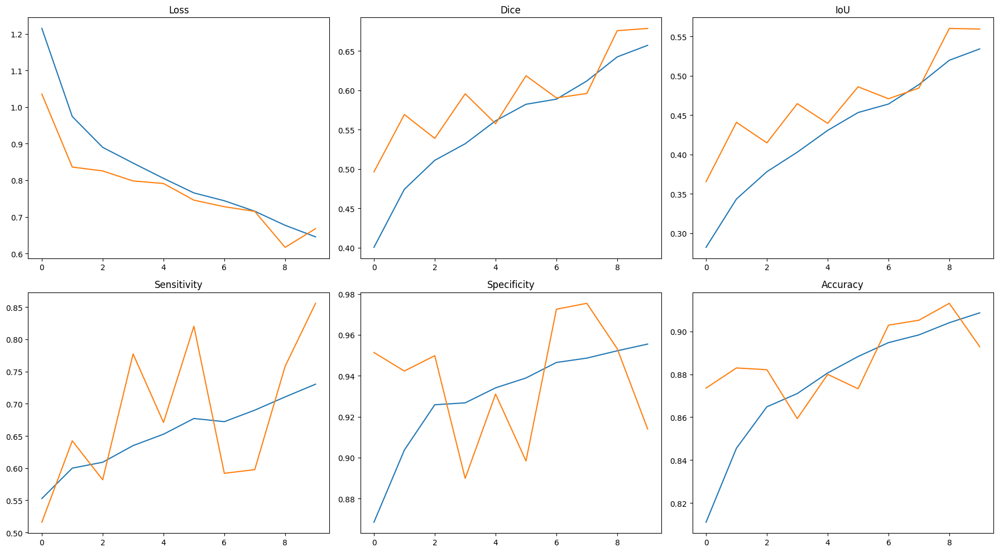

Saved checkpoint: befunet_paper_epoch10.pth

Epoch [11/40]


Train => Loss: 0.6328 | Dice: 0.6728 | IoU: 0.5514
         SE: 0.7361 | SP: 0.9596 | ACC: 0.9119
Val   => Loss: 0.5945 | Dice: 0.6933 | IoU: 0.5790
         SE: 0.7665 | SP: 0.9555 | ACC: 0.9153
----------------------------------------------------------------------

Epoch [12/40]


Train => Loss: 0.5988 | Dice: 0.6896 | IoU: 0.5723
         SE: 0.7454 | SP: 0.9639 | ACC: 0.9172
Val   => Loss: 0.7073 | Dice: 0.6348 | IoU: 0.5042
         SE: 0.8287 | SP: 0.9117 | ACC: 0.8862
----------------------------------------------------------------------

Epoch [13/40]


Train => Loss: 0.5751 | Dice: 0.7046 | IoU: 0.5876
         SE: 0.7645 | SP: 0.9627 | ACC: 0.9204
Val   => Loss: 0.5449 | Dice: 0.7210 | IoU: 0.6048
         SE: 0.7336 | SP: 0.9713 | ACC: 0.9234
----------------------------------------------------------------------

Epoch [14/40]


Train => Loss: 0.5638 | Dice: 0.7108 | IoU: 0.5954
         SE: 0.7671 | SP: 0.9650 | ACC: 0.9214
Val   => Loss: 0.5693 | Dice: 0.7195 | IoU: 0.6072
         SE: 0.8245 | SP: 0.9435 | ACC: 0.9176
----------------------------------------------------------------------

Epoch [15/40]


Train => Loss: 0.5472 | Dice: 0.7265 | IoU: 0.6156
         SE: 0.7697 | SP: 0.9702 | ACC: 0.9250
Val   => Loss: 0.5629 | Dice: 0.7100 | IoU: 0.6025
         SE: 0.7901 | SP: 0.9520 | ACC: 0.9179
----------------------------------------------------------------------

Epoch [16/40]


Train => Loss: 0.5265 | Dice: 0.7341 | IoU: 0.6210
         SE: 0.7991 | SP: 0.9636 | ACC: 0.9258
Val   => Loss: 0.5242 | Dice: 0.7357 | IoU: 0.6204
         SE: 0.7636 | SP: 0.9692 | ACC: 0.9263
----------------------------------------------------------------------

Epoch [17/40]


Train => Loss: 0.5089 | Dice: 0.7417 | IoU: 0.6335
         SE: 0.7854 | SP: 0.9717 | ACC: 0.9305
Val   => Loss: 0.4979 | Dice: 0.7581 | IoU: 0.6543
         SE: 0.8570 | SP: 0.9575 | ACC: 0.9305
----------------------------------------------------------------------

Epoch [18/40]


Train => Loss: 0.4789 | Dice: 0.7626 | IoU: 0.6585
         SE: 0.8087 | SP: 0.9704 | ACC: 0.9343
Val   => Loss: 0.5330 | Dice: 0.7364 | IoU: 0.6344
         SE: 0.7065 | SP: 0.9877 | ACC: 0.9339
----------------------------------------------------------------------

Epoch [19/40]


Train => Loss: 0.4984 | Dice: 0.7566 | IoU: 0.6504
         SE: 0.8013 | SP: 0.9694 | ACC: 0.9307
Val   => Loss: 0.4726 | Dice: 0.7577 | IoU: 0.6532
         SE: 0.7925 | SP: 0.9704 | ACC: 0.9342
----------------------------------------------------------------------

Epoch [20/40]


Train => Loss: 0.4690 | Dice: 0.7702 | IoU: 0.6671
         SE: 0.8087 | SP: 0.9716 | ACC: 0.9357
Val   => Loss: 0.5257 | Dice: 0.7361 | IoU: 0.6332
         SE: 0.7084 | SP: 0.9871 | ACC: 0.9331
----------------------------------------------------------------------


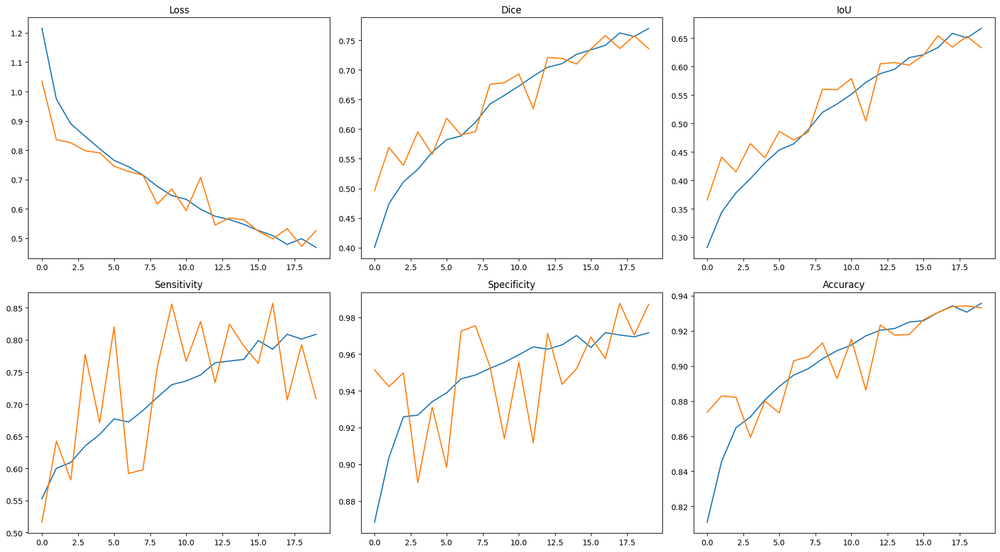

Saved checkpoint: befunet_paper_epoch20.pth

Epoch [21/40]


Train => Loss: 0.4345 | Dice: 0.7894 | IoU: 0.6891
         SE: 0.8317 | SP: 0.9710 | ACC: 0.9396
Val   => Loss: 0.4681 | Dice: 0.7679 | IoU: 0.6696
         SE: 0.8586 | SP: 0.9519 | ACC: 0.9305
----------------------------------------------------------------------

Epoch [22/40]


Train => Loss: 0.4457 | Dice: 0.7840 | IoU: 0.6836
         SE: 0.8178 | SP: 0.9737 | ACC: 0.9392
Val   => Loss: 0.4693 | Dice: 0.7654 | IoU: 0.6676
         SE: 0.8183 | SP: 0.9662 | ACC: 0.9355
----------------------------------------------------------------------

Epoch [23/40]


Train => Loss: 0.4310 | Dice: 0.7898 | IoU: 0.6893
         SE: 0.8225 | SP: 0.9755 | ACC: 0.9412
Val   => Loss: 0.4650 | Dice: 0.7592 | IoU: 0.6594
         SE: 0.7852 | SP: 0.9750 | ACC: 0.9388
----------------------------------------------------------------------

Epoch [24/40]


Train => Loss: 0.4365 | Dice: 0.7855 | IoU: 0.6876
         SE: 0.8196 | SP: 0.9736 | ACC: 0.9398
Val   => Loss: 0.4506 | Dice: 0.7741 | IoU: 0.6717
         SE: 0.7518 | SP: 0.9861 | ACC: 0.9389
----------------------------------------------------------------------

Epoch [25/40]


Train => Loss: 0.4118 | Dice: 0.7992 | IoU: 0.7043
         SE: 0.8367 | SP: 0.9738 | ACC: 0.9433
Val   => Loss: 0.4678 | Dice: 0.7644 | IoU: 0.6635
         SE: 0.7638 | SP: 0.9825 | ACC: 0.9379
----------------------------------------------------------------------

Epoch [26/40]


Train => Loss: 0.4142 | Dice: 0.7998 | IoU: 0.7030
         SE: 0.8332 | SP: 0.9734 | ACC: 0.9422
Val   => Loss: 0.4332 | Dice: 0.7856 | IoU: 0.6891
         SE: 0.7820 | SP: 0.9812 | ACC: 0.9417
----------------------------------------------------------------------

Epoch [27/40]


Train => Loss: 0.3768 | Dice: 0.8178 | IoU: 0.7234
         SE: 0.8397 | SP: 0.9784 | ACC: 0.9490
Val   => Loss: 0.5254 | Dice: 0.7414 | IoU: 0.6349
         SE: 0.8757 | SP: 0.9302 | ACC: 0.9158
----------------------------------------------------------------------

Epoch [28/40]


Train => Loss: 0.3819 | Dice: 0.8133 | IoU: 0.7187
         SE: 0.8474 | SP: 0.9748 | ACC: 0.9466
Val   => Loss: 0.4683 | Dice: 0.7744 | IoU: 0.6811
         SE: 0.7508 | SP: 0.9876 | ACC: 0.9388
----------------------------------------------------------------------

Epoch [29/40]


Train => Loss: 0.3743 | Dice: 0.8198 | IoU: 0.7259
         SE: 0.8486 | SP: 0.9760 | ACC: 0.9486
Val   => Loss: 0.4288 | Dice: 0.7987 | IoU: 0.7015
         SE: 0.7774 | SP: 0.9873 | ACC: 0.9448
----------------------------------------------------------------------

Epoch [30/40]


Train => Loss: 0.3363 | Dice: 0.8390 | IoU: 0.7500
         SE: 0.8606 | SP: 0.9785 | ACC: 0.9538
Val   => Loss: 0.4224 | Dice: 0.7870 | IoU: 0.6948
         SE: 0.8089 | SP: 0.9770 | ACC: 0.9431
----------------------------------------------------------------------


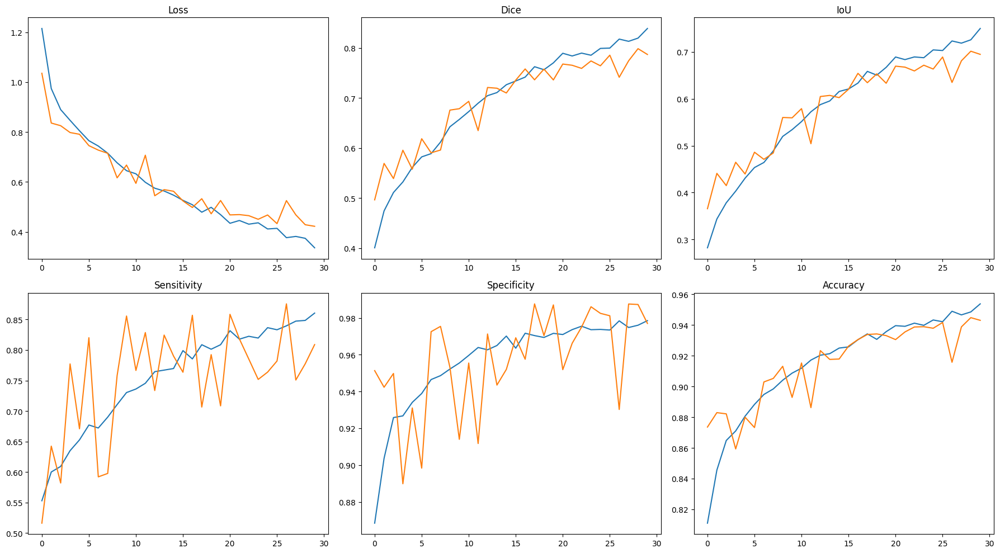

Saved checkpoint: befunet_paper_epoch30.pth

Epoch [31/40]


Train => Loss: 0.3340 | Dice: 0.8367 | IoU: 0.7496
         SE: 0.8606 | SP: 0.9771 | ACC: 0.9541
Val   => Loss: 0.4281 | Dice: 0.7884 | IoU: 0.6972
         SE: 0.8322 | SP: 0.9708 | ACC: 0.9418
----------------------------------------------------------------------

Epoch [32/40]


Train => Loss: 0.3240 | Dice: 0.8396 | IoU: 0.7534
         SE: 0.8723 | SP: 0.9762 | ACC: 0.9554
Val   => Loss: 0.3938 | Dice: 0.8115 | IoU: 0.7229
         SE: 0.8003 | SP: 0.9872 | ACC: 0.9486
----------------------------------------------------------------------

Epoch [33/40]


Train => Loss: 0.3302 | Dice: 0.8393 | IoU: 0.7537
         SE: 0.8618 | SP: 0.9785 | ACC: 0.9550
Val   => Loss: 0.4701 | Dice: 0.7635 | IoU: 0.6722
         SE: 0.7447 | SP: 0.9884 | ACC: 0.9397
----------------------------------------------------------------------

Epoch [34/40]


Train => Loss: 0.3194 | Dice: 0.8444 | IoU: 0.7615
         SE: 0.8627 | SP: 0.9786 | ACC: 0.9560
Val   => Loss: 0.4313 | Dice: 0.7899 | IoU: 0.7002
         SE: 0.8548 | SP: 0.9623 | ACC: 0.9377
----------------------------------------------------------------------

Epoch [35/40]


Train => Loss: 0.3051 | Dice: 0.8517 | IoU: 0.7679
         SE: 0.8729 | SP: 0.9769 | ACC: 0.9575
Val   => Loss: 0.3886 | Dice: 0.8140 | IoU: 0.7266
         SE: 0.8599 | SP: 0.9724 | ACC: 0.9453
----------------------------------------------------------------------

Epoch [36/40]


Train => Loss: 0.2957 | Dice: 0.8581 | IoU: 0.7757
         SE: 0.8814 | SP: 0.9784 | ACC: 0.9585
Val   => Loss: 0.4028 | Dice: 0.8040 | IoU: 0.7145
         SE: 0.8238 | SP: 0.9793 | ACC: 0.9465
----------------------------------------------------------------------

Epoch [37/40]


Train => Loss: 0.2718 | Dice: 0.8664 | IoU: 0.7872
         SE: 0.8852 | SP: 0.9781 | ACC: 0.9622
Val   => Loss: 0.4415 | Dice: 0.7921 | IoU: 0.6969
         SE: 0.7915 | SP: 0.9857 | ACC: 0.9411
----------------------------------------------------------------------

Epoch [38/40]


Train => Loss: 0.2694 | Dice: 0.8686 | IoU: 0.7887
         SE: 0.8834 | SP: 0.9809 | ACC: 0.9630
Val   => Loss: 0.4057 | Dice: 0.8077 | IoU: 0.7195
         SE: 0.8025 | SP: 0.9866 | ACC: 0.9458
----------------------------------------------------------------------

Epoch [39/40]


Train => Loss: 0.2663 | Dice: 0.8728 | IoU: 0.7942
         SE: 0.8907 | SP: 0.9798 | ACC: 0.9631
Val   => Loss: 0.4364 | Dice: 0.7859 | IoU: 0.6890
         SE: 0.8882 | SP: 0.9534 | ACC: 0.9349
----------------------------------------------------------------------

Epoch [40/40]


Train => Loss: 0.2569 | Dice: 0.8734 | IoU: 0.7967
         SE: 0.8899 | SP: 0.9796 | ACC: 0.9646
Val   => Loss: 0.3835 | Dice: 0.8129 | IoU: 0.7187
         SE: 0.8409 | SP: 0.9786 | ACC: 0.9480
----------------------------------------------------------------------


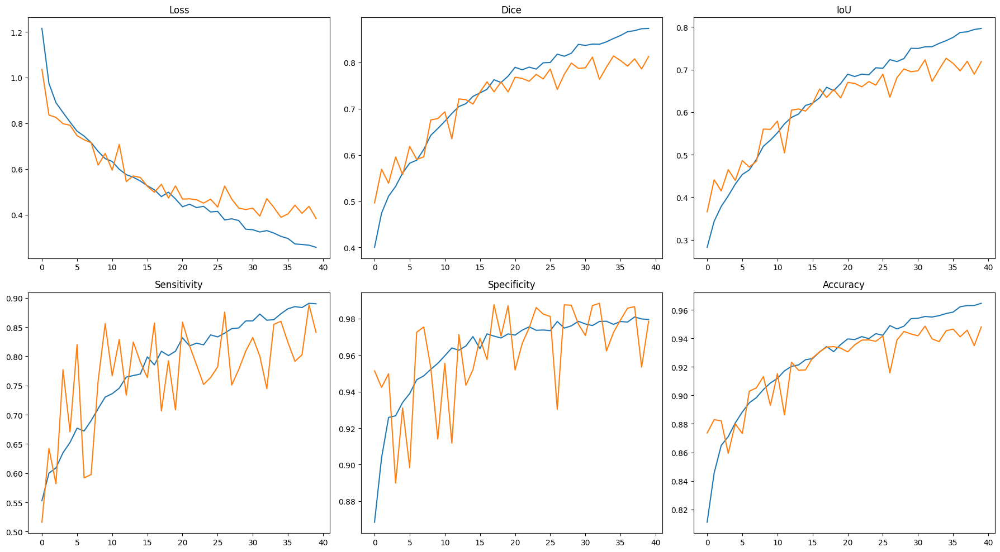

Saved checkpoint: befunet_paper_epoch40.pth
Saved final model: befunet_paper_final_40epochs.pth


In [20]:
# =========================
# Step 10: Train BEFUnet Hybrid Model
# =========================

model_befunet = BEFUnet().to(device)
optimizer = torch.optim.AdamW(model_befunet.parameters(), lr=1e-4)
loss_fn = BCEDiceLoss()

num_epochs = 40

# Logs
train_losses = []
val_losses   = []

train_dices = []
val_dices   = []

train_ious = []
val_ious   = []

train_sens = []
val_sens   = []

train_specs = []
val_specs   = []

train_accs = []
val_accs   = []

for epoch in range(1, num_epochs + 1):
    print(f"\nEpoch [{epoch}/{num_epochs}]")

    # ---- Training ----
    (train_loss, train_dice, train_iou,
     train_se, train_sp, train_acc) = train_one_epoch(
        model_befunet, train_loader, optimizer, loss_fn
    )

    # ---- Validation ----
    (val_loss, val_dice, val_iou,
     val_se, val_sp, val_acc) = validate_one_epoch(
        model_befunet, val_loader, loss_fn
    )

    # ---- Store logs ----
    train_losses.append(train_loss)
    val_losses.append(val_loss)

    train_dices.append(train_dice)
    val_dices.append(val_dice)

    train_ious.append(train_iou)
    val_ious.append(val_iou)

    train_sens.append(train_se)
    val_sens.append(val_se)

    train_specs.append(train_sp)
    val_specs.append(val_sp)

    train_accs.append(train_acc)
    val_accs.append(val_acc)

    # ---- Print epoch summary ----
    print(f"Train => Loss: {train_loss:.4f} | Dice: {train_dice:.4f} | IoU: {train_iou:.4f}")
    print(f"         SE: {train_se:.4f} | SP: {train_sp:.4f} | ACC: {train_acc:.4f}")
    print(f"Val   => Loss: {val_loss:.4f} | Dice: {val_dice:.4f} | IoU: {val_iou:.4f}")
    print(f"         SE: {val_se:.4f} | SP: {val_sp:.4f} | ACC: {val_acc:.4f}")
    print("-" * 70)

    # ---- Plot metrics every 10 epochs ----
    if epoch % 10 == 0:
        fig, axes = plt.subplots(2, 3, figsize=(18,10))

        axes[0][0].plot(train_losses); axes[0][0].plot(val_losses); axes[0][0].set_title("Loss")
        axes[0][1].plot(train_dices); axes[0][1].plot(val_dices); axes[0][1].set_title("Dice")
        axes[0][2].plot(train_ious);  axes[0][2].plot(val_ious);  axes[0][2].set_title("IoU")
        axes[1][0].plot(train_sens);  axes[1][0].plot(val_sens);  axes[1][0].set_title("Sensitivity")
        axes[1][1].plot(train_specs); axes[1][1].plot(val_specs); axes[1][1].set_title("Specificity")
        axes[1][2].plot(train_accs);  axes[1][2].plot(val_accs);  axes[1][2].set_title("Accuracy")

        plt.tight_layout()
        plt.show()

    # ---- Save checkpoint every 10 epochs ----
    if epoch % 10 == 0:
        ckpt_name = f"befunet_paper_epoch{epoch}.pth"
        torch.save(model_befunet.state_dict(), ckpt_name)
        print(f"Saved checkpoint: {ckpt_name}")

# ---- Save final model ----
torch.save(model_befunet.state_dict(), "befunet_paper_final_40epochs.pth")
print("Saved final model: befunet_paper_final_40epochs.pth")


In [21]:
# =========================
# Test BEFUnet at epochs 10,20,40
# =========================

CHECKPOINTS = [
    "/kaggle/input/befunet-paper/pytorch/default/1/befunet_paper_epoch10.pth",
    "/kaggle/input/befunet-paper/pytorch/default/1/befunet_paper_epoch20.pth",
    "/kaggle/input/befunet-paper/pytorch/default/1/befunet_paper_epoch40.pth",
]

results = []

for ckpt in CHECKPOINTS:
    print(f"\n=== Testing checkpoint: {ckpt} ===")

    model = BEFUnet().to(device)
    model.load_state_dict(torch.load(ckpt, map_location=device))
    model.eval()

    test_loss = 0
    test_dice = 0
    test_iou  = 0
    test_se   = 0
    test_sp   = 0
    test_acc  = 0

    with torch.no_grad():
        for imgs, masks in tqdm(test_loader, desc=f"Testing {ckpt}"):
            imgs  = imgs.to(device)
            masks = masks.to(device)

            preds = model(imgs)
            loss  = loss_fn(preds, masks)

            test_loss += loss.item()
            test_dice += dice_coef(preds, masks).item()
            test_iou  += iou_coef(preds, masks).item()
            test_se   += sensitivity(preds, masks).item()
            test_sp   += specificity(preds, masks).item()
            test_acc  += accuracy(preds, masks).item()

    n = len(test_loader)

    results.append({
        "checkpoint": ckpt,
        "loss": test_loss/n,
        "dice": test_dice/n,
        "iou":  test_iou/n,
        "se":   test_se/n,
        "sp":   test_sp/n,
        "acc":  test_acc/n
    })


# =========================
# Print final comparison table
# =========================

import pandas as pd

df = pd.DataFrame(results)
df



=== Testing checkpoint: /kaggle/input/befunet-paper/pytorch/default/1/befunet_paper_epoch10.pth ===


Testing /kaggle/input/befunet-paper/pytorch/default/1/befunet_paper_epoch10.pth: 100%|██████████| 7/7 [02:30<00:00, 21.55s/it]



=== Testing checkpoint: /kaggle/input/befunet-paper/pytorch/default/1/befunet_paper_epoch20.pth ===


Testing /kaggle/input/befunet-paper/pytorch/default/1/befunet_paper_epoch20.pth: 100%|██████████| 7/7 [02:29<00:00, 21.39s/it]



=== Testing checkpoint: /kaggle/input/befunet-paper/pytorch/default/1/befunet_paper_epoch40.pth ===


Testing /kaggle/input/befunet-paper/pytorch/default/1/befunet_paper_epoch40.pth: 100%|██████████| 7/7 [02:30<00:00, 21.53s/it]


,checkpoint,loss,dice,iou,se,sp,acc
0,/kaggle/input/befunet-paper/pytorch/default/1/...,0.740372,0.659940,0.540506,0.829194,0.910384,0.878699
1,/kaggle/input/befunet-paper/pytorch/default/1/...,0.607419,0.722470,0.617775,0.711014,0.983546,0.913372
2,/kaggle/input/befunet-paper/pytorch/default/1/...,0.509771,0.769175,0.670917,0.800641,0.969181,0.920908


In [55]:
# ============================================
# PER-IMAGE TEST EVALUATION (U-Net + BEFUnet LCAF+DLF)
# ============================================

import torch
import pandas as pd
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# ------------------------------------------------
# CHECKPOINT PATHS
# ------------------------------------------------
CKPT_UNET = "/kaggle/input/unet-baseline/pytorch/default/1/unet_epoch_20.pth"
CKPT_LCAF_DLF = "/kaggle/input/befunet-paper/pytorch/default/1/befunet_paper_epoch40.pth"


# ------------------------------------------------
# LOAD MODELS
# ------------------------------------------------
model_unet = UNet().to(device)
model_unet.load_state_dict(torch.load(CKPT_UNET, map_location=device))
model_unet.eval()

model_lcaf = BEFUnet().to(device)   # configured for LCAF+DLF
model_lcaf.load_state_dict(torch.load(CKPT_LCAF_DLF, map_location=device))
model_lcaf.eval()


# ------------------------------------------------
# RESULT STORAGE
# ------------------------------------------------
rows = []
image_counter = 0   # TRUE image id


# ------------------------------------------------
# PER-IMAGE TEST LOOP (CORRECTED)
# ------------------------------------------------
with torch.no_grad():
    for batch_imgs, batch_masks in tqdm(test_loader, desc="Testing per image"):

        batch_imgs  = batch_imgs.to(device)
        batch_masks = batch_masks.to(device)

        b = batch_imgs.size(0)   # number of images in this batch

        for i in range(b):
            img  = batch_imgs[i:i+1]
            mask = batch_masks[i:i+1]

            # =======================
            # U-NET
            # =======================
            pred_u = model_unet(img)

            loss_u = loss_fn(pred_u, mask).item()
            d_u = dice_coef(pred_u, mask).item()
            i_u = iou_coef(pred_u, mask).item()
            se_u = sensitivity(pred_u, mask).item()
            sp_u = specificity(pred_u, mask).item()
            acc_u = accuracy(pred_u, mask).item()

            # =======================
            # BEFUNET (LCAF + DLF)
            # =======================
            pred_l = model_lcaf(img)

            loss_l = loss_fn(pred_l, mask).item()
            d_l = dice_coef(pred_l, mask).item()
            i_l = iou_coef(pred_l, mask).item()
            se_l = sensitivity(pred_l, mask).item()
            sp_l = specificity(pred_l, mask).item()
            acc_l = accuracy(pred_l, mask).item()

            # =======================
            # SAVE ONE ROW PER IMAGE
            # =======================
            rows.append({
                "image_id": image_counter,

                # U-NET METRICS
                "unet_loss": loss_u,
                "unet_dice": d_u,
                "unet_iou": i_u,
                "unet_se": se_u,
                "unet_sp": sp_u,
                "unet_acc": acc_u,

                # LCAF + DLF METRICS
                "lcaf_loss": loss_l,
                "lcaf_dice": d_l,
                "lcaf_iou": i_l,
                "lcaf_se": se_l,
                "lcaf_sp": sp_l,
                "lcaf_acc": acc_l,
            })

            image_counter += 1   # move to next image id


# ------------------------------------------------
# CONVERT TO DATAFRAME
# ------------------------------------------------
df_test_partial = pd.DataFrame(rows)
df_test_partial


Testing per image: 100%|██████████| 7/7 [03:27<00:00, 29.66s/it]


,image_id,unet_loss,unet_dice,unet_iou,unet_se,unet_sp,unet_acc,lcaf_loss,lcaf_dice,lcaf_iou,lcaf_se,lcaf_sp,lcaf_acc
0,0,0.509030,0.788441,0.650766,0.994152,0.981473,0.981903,0.360564,0.771911,0.628547,0.976608,0.980557,0.980423
1,1,0.560095,0.708910,0.549079,0.724725,0.961789,0.936493,0.034294,0.987131,0.974589,0.992707,0.997779,0.997238
2,2,0.225710,0.932532,0.873592,0.974692,0.960882,0.964371,0.518723,0.822929,0.699133,0.978558,0.864904,0.893616
3,3,0.663520,0.613574,0.442558,0.977421,0.949812,0.950912,0.530571,0.632938,0.462991,0.938385,0.957361,0.956604
4,4,0.407840,0.906879,0.829624,0.911467,0.996295,0.993225,0.110173,0.926033,0.862256,0.873524,0.999509,0.994949
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,95,0.145353,0.979129,0.959112,0.978317,0.992018,0.988113,0.805639,0.667374,0.500796,0.656923,0.875731,0.813370
96,96,0.427141,0.931709,0.872149,0.997255,0.996738,0.996750,0.152508,0.965827,0.933912,0.960192,0.999360,0.998489
97,97,1.656638,0.228929,0.129260,0.129370,0.999358,0.625336,2.540452,0.016693,0.008417,0.008589,0.984556,0.564972
98,98,1.130393,0.520220,0.351553,0.352445,0.998331,0.742218,0.796048,0.735513,0.581669,0.582676,0.998862,0.833832


In [58]:
# ================================================
#  ADD BEFUnet-EGF RESULTS TO EXISTING DATAFRAME (PER-IMAGE)
# ================================================

import torch
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ------------------------------------------------
# Load EGF model
# ------------------------------------------------
CKPT_EGF = "/kaggle/input/befunet-ours/pytorch/default/1/befunet_epoch20.pth"

model_egf = BEFUnet().to(device)  # configured internally for EGF
model_egf.load_state_dict(torch.load(CKPT_EGF, map_location=device))
model_egf.eval()


# ------------------------------------------------
# Prepare metric lists
# ------------------------------------------------
egf_loss_list = []
egf_dice_list = []
egf_iou_list  = []
egf_se_list   = []
egf_sp_list   = []
egf_acc_list  = []


# ------------------------------------------------
# PER-IMAGE TEST LOOP FOR BEFUnet-EGF (FIXED)
# ------------------------------------------------
with torch.no_grad():
    for batch_imgs, batch_masks in tqdm(test_loader, desc="Evaluating BEFUnet-EGF"):

        batch_imgs  = batch_imgs.to(device)
        batch_masks = batch_masks.to(device)

        b = batch_imgs.size(0)  # number of images in batch

        for i in range(b):
            img  = batch_imgs[i:i+1]
            mask = batch_masks[i:i+1]

            pred = model_egf(img)

            # compute metrics per image
            egf_loss_list.append(loss_fn(pred, mask).item())
            egf_dice_list.append(dice_coef(pred, mask).item())
            egf_iou_list.append(iou_coef(pred, mask).item())
            egf_se_list.append(sensitivity(pred, mask).item())
            egf_sp_list.append(specificity(pred, mask).item())
            egf_acc_list.append(accuracy(pred, mask).item())


# ------------------------------------------------
# APPEND PER-IMAGE COLUMNS TO df_test_partial
# ------------------------------------------------
df_test_partial["egf_loss"] = egf_loss_list
df_test_partial["egf_dice"] = egf_dice_list
df_test_partial["egf_iou"]  = egf_iou_list
df_test_partial["egf_se"]   = egf_se_list
df_test_partial["egf_sp"]   = egf_sp_list
df_test_partial["egf_acc"]  = egf_acc_list


# ------------------------------------------------
# FINAL MERGED DATAFRAME
# ------------------------------------------------
df_test_full = df_test_partial
df_test_full


Evaluating BEFUnet-EGF: 100%|██████████| 7/7 [01:15<00:00, 10.75s/it]


,image_id,unet_loss,unet_dice,unet_iou,unet_se,unet_sp,unet_acc,lcaf_loss,lcaf_dice,lcaf_iou,lcaf_se,lcaf_sp,lcaf_acc,egf_loss,egf_dice,egf_iou,egf_se,egf_sp,egf_acc
0,0,0.509030,0.788441,0.650766,0.994152,0.981473,0.981903,0.360564,0.771911,0.628547,0.976608,0.980557,0.980423,1.140777,0.308215,0.182183,1.000000,0.842386,0.847733
1,1,0.560095,0.708910,0.549079,0.724725,0.961789,0.936493,0.034294,0.987131,0.974589,0.992707,0.997779,0.997238,0.341206,0.783712,0.644347,0.671529,0.994961,0.960449
2,2,0.225710,0.932532,0.873592,0.974692,0.960882,0.964371,0.518723,0.822929,0.699133,0.978558,0.864904,0.893616,0.706715,0.775338,0.633103,0.979826,0.814884,0.856552
3,3,0.663520,0.613574,0.442558,0.977421,0.949812,0.950912,0.530571,0.632938,0.462991,0.938385,0.957361,0.956604,0.801308,0.490686,0.325106,0.972828,0.917264,0.919479
4,4,0.407840,0.906879,0.829624,0.911467,0.996295,0.993225,0.110173,0.926033,0.862256,0.873524,0.999509,0.994949,0.371483,0.798932,0.665184,0.693508,0.998401,0.987366
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,95,0.145353,0.979129,0.959112,0.978317,0.992018,0.988113,0.805639,0.667374,0.500796,0.656923,0.875731,0.813370,0.347602,0.895589,0.810920,0.916854,0.947928,0.939072
96,96,0.427141,0.931709,0.872149,0.997255,0.996738,0.996750,0.152508,0.965827,0.933912,0.960192,0.999360,0.998489,0.300561,0.875268,0.778202,0.980096,0.994101,0.993790
97,97,1.656638,0.228929,0.129260,0.129370,0.999358,0.625336,2.540452,0.016693,0.008417,0.008589,0.984556,0.564972,1.783720,0.247031,0.140921,0.145803,0.973876,0.617874
98,98,1.130393,0.520220,0.351553,0.352445,0.998331,0.742218,0.796048,0.735513,0.581669,0.582676,0.998862,0.833832,1.115115,0.636506,0.466820,0.467772,0.998660,0.788147


In [71]:
# ============================================
# SELECT BEST & WORST IMAGES FOR U-NET, LCAF, EGF
# ============================================

selected_ids = set()   # use set to avoid duplicates

# Helper function
def pick_ids(metric_col):
    """Return top-3 and bottom-3 image_ids for a given metric column."""
    top3 = df_test_full.nlargest(5, metric_col)["image_id"].tolist()
    bottom3 = df_test_full.nsmallest(5, metric_col)["image_id"].tolist()
    return top3, bottom3


# ----------------------------
# U-NET top/bottom 3
# ----------------------------
u_top, u_bottom = pick_ids("unet_dice")
selected_ids.update(u_top)
selected_ids.update(u_bottom)

# ----------------------------
# LCAF+DLF top/bottom 3
# ----------------------------
l_top, l_bottom = pick_ids("lcaf_dice")
selected_ids.update(l_top)
selected_ids.update(l_bottom)

# ----------------------------
# EGF top/bottom 3
# ----------------------------
e_top, e_bottom = pick_ids("egf_dice")
selected_ids.update(e_top)
selected_ids.update(e_bottom)

# Convert to sorted list
selected_ids = sorted(list(selected_ids))

print("Total selected images:", len(selected_ids))
print("Selected image IDs:", selected_ids)


Total selected images: 19
Selected image IDs: [1, 8, 20, 29, 30, 35, 44, 47, 58, 69, 70, 72, 77, 80, 82, 83, 88, 95, 97]


In [75]:
# ==========================================================
#  RUN U-NET + BEFUnet(EGF) on SELECTED IMAGES & STORE OUTPUT
# ==========================================================

import torch
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# -------------------------------------------
# Load U-Net + BEFUnet (EGF mode)
# -------------------------------------------
CKPT_UNET = "/kaggle/input/unet-baseline/pytorch/default/1/unet_epoch_20.pth"
CKPT_EGF  = "/kaggle/input/befunet-ours/pytorch/default/1/befunet_epoch20.pth"

model_unet = UNet().to(device)
model_unet.load_state_dict(torch.load(CKPT_UNET, map_location=device))
model_unet.eval()

model_egf = BEFUnet().to(device)   # currently configured for EGF
model_egf.load_state_dict(torch.load(CKPT_EGF, map_location=device))
model_egf.eval()

# -------------------------------------------
# STORAGE: will later add "lcaf" field too
# -------------------------------------------
saved_samples = []


# -------------------------------------------
# RUN OVER THE TEST SET AND STORE ONLY SELECTED IMAGES
# -------------------------------------------
image_counter = 0

with torch.no_grad():
    for batch_imgs, batch_masks in tqdm(test_loader, desc="Collecting samples"):

        batch_imgs  = batch_imgs.to(device)
        batch_masks = batch_masks.to(device)

        b = batch_imgs.size(0)

        for i in range(b):

            if image_counter in selected_ids:

                img  = batch_imgs[i:i+1]
                mask = batch_masks[i:i+1]

                # Predictions
                pred_unet = model_unet(img)
                pred_egf  = model_egf(img)

                # Store everything in CPU
                saved_samples.append({
                    "image_id": image_counter,
                    "image": img.cpu(),
                    "mask": mask.cpu(),
                    "unet": pred_unet.cpu(),
                    "egf":  pred_egf.cpu(),
                    "lcaf": None    # will fill later
                })

            image_counter += 1

len(saved_samples)


19

In [79]:
# ==========================================================
#  APPEND BEFUnet (LCAF+DLF) PREDICTIONS TO SAVED SAMPLES
# ==========================================================

import torch
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ------------------------------------------------
# Load BEFUnet configured for LCAF+DLF
# ------------------------------------------------
CKPT_LCAF_DLF = "/kaggle/input/befunet-paper/pytorch/default/1/befunet_paper_epoch40.pth"

model_lcaf = BEFUnet().to(device)    # now BEFUnet internally uses LCAF+DLF
model_lcaf.load_state_dict(torch.load(CKPT_LCAF_DLF, map_location=device))
model_lcaf.eval()


# ------------------------------------------------
# RUN LCAF+DLF ONLY ON SELECTED SAMPLES
# ------------------------------------------------
with torch.no_grad():
    for sample in tqdm(saved_samples, desc="Appending LCAF predictions"):

        img = sample["image"].to(device)      # (1,3,H,W)

        # predict
        pred_lcaf = model_lcaf(img)

        # store CPU tensor
        sample["lcaf"] = pred_lcaf.cpu()


Appending LCAF predictions: 100%|██████████| 19/19 [00:20<00:00,  1.07s/it]


In [80]:
# ==========================================================
# 5-PANEL VISUALIZATION (EGF LAST)
# ==========================================================

import numpy as np
import matplotlib.pyplot as plt
import torch

# ------------------------------------------------------
# SAFE RGB CONVERSION
# ------------------------------------------------------
def to_rgb(img_tensor):
    """Convert tensor to HWC RGB in [0,1], safe for imshow()."""
    img = img_tensor.squeeze().cpu().numpy()  # CHW or HWC
    
    # CHW → HWC
    if img.ndim == 3 and img.shape[0] in [1,3]:
        img = np.transpose(img, (1,2,0))
    
    # Normalize
    if img.max() > 1.0:
        img = img / 255.0
    
    return np.clip(img, 0, 1)


# ------------------------------------------------------
# OVERLAY PREDICTION IN RED ON TOP OF IMAGE
# ------------------------------------------------------
def overlay_prediction(img_tensor, pred_tensor, thresh=0.5):
    img = to_rgb(img_tensor)
    pred = torch.sigmoid(pred_tensor).squeeze().cpu().numpy()
    pred_mask = (pred > thresh).astype(np.float32)

    # red mask
    red = np.zeros_like(img)
    red[:, :, 0] = pred_mask

    # blend
    blended = 0.7 * img + 0.3 * red
    return np.clip(blended, 0, 1)


# ------------------------------------------------------
# VISUALIZE SAVED SAMPLES IN ORDER
# ------------------------------------------------------
def visualize_saved_samples(saved_samples):

    for sample in saved_samples:

        img  = sample["image"]
        mask = sample["mask"]
        unet = sample["unet"]
        lcaf = sample["lcaf"]
        egf  = sample["egf"]    # EGF is last

        plt.figure(figsize=(22,5))

        # 1) Original Image
        plt.subplot(1,5,1)
        plt.imshow(to_rgb(img))
        plt.title("Original")
        plt.axis("off")

        # 2) Ground Truth Mask
        plt.subplot(1,5,2)
        plt.imshow(mask.squeeze().cpu(), cmap="gray")
        plt.title("Mask")
        plt.axis("off")

        # 3) U-Net
        plt.subplot(1,5,3)
        plt.imshow(overlay_prediction(img, unet))
        plt.title("U-Net")
        plt.axis("off")

        # 4) BEFUnet (LCAF + DLF)
        plt.subplot(1,5,4)
        plt.imshow(overlay_prediction(img, lcaf))
        plt.title("BEFUnet (LCAF + DLF)")
        plt.axis("off")

        # 5) BEFUnet + EGF (Ours)
        plt.subplot(1,5,5)
        plt.imshow(overlay_prediction(img, egf))
        plt.title("BEFUnet + EGF (Ours)")
        plt.axis("off")

        plt.tight_layout()
        plt.show()


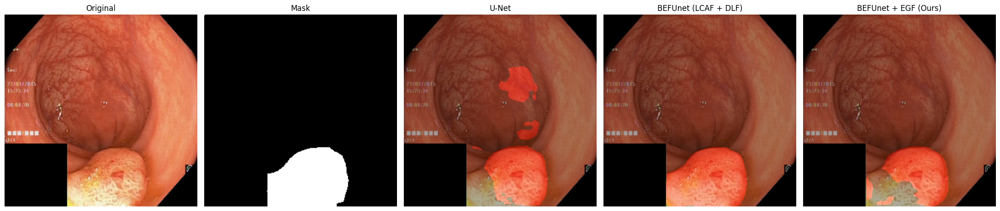

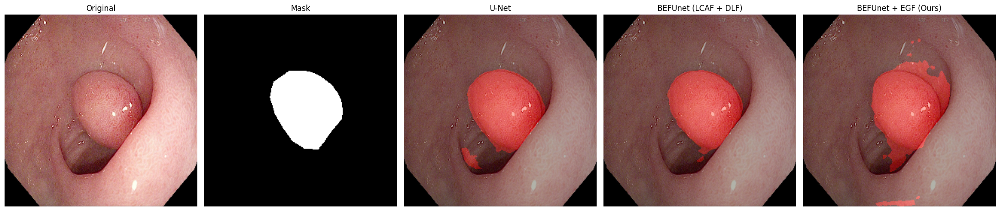

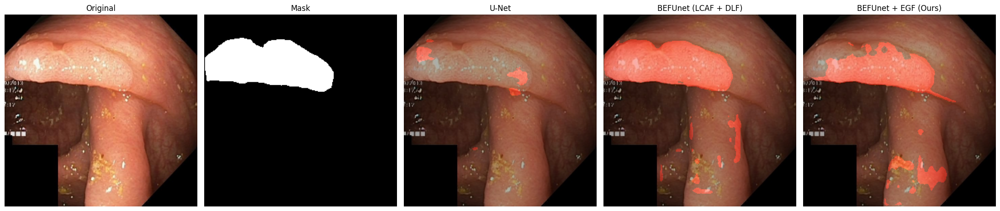

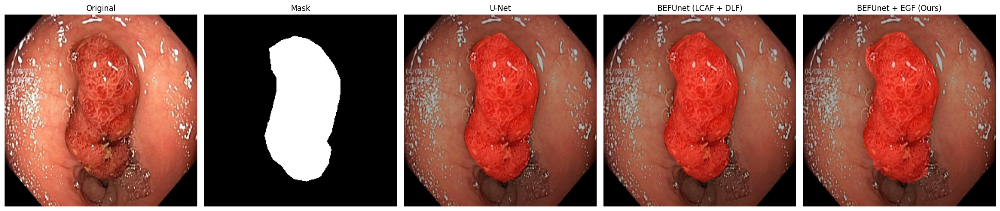

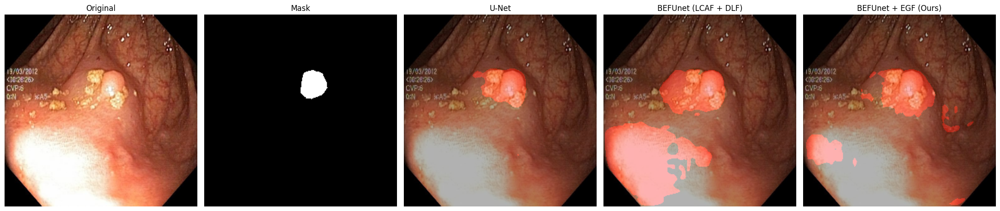

...

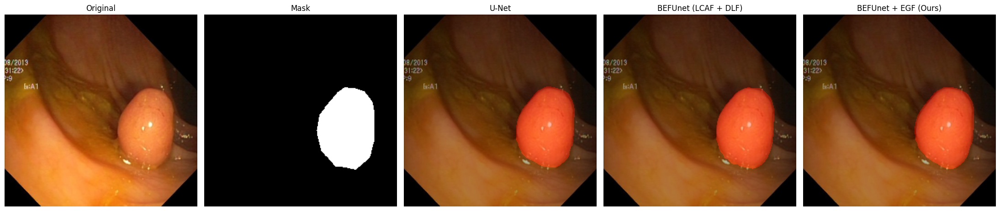

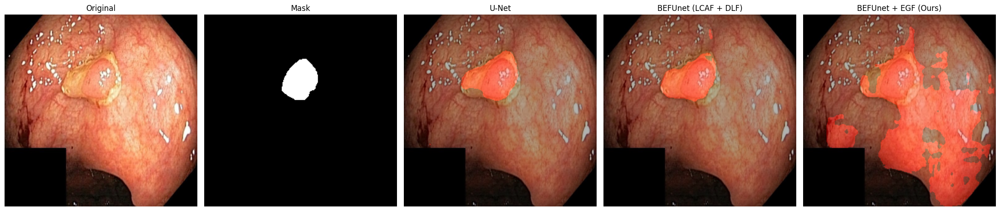

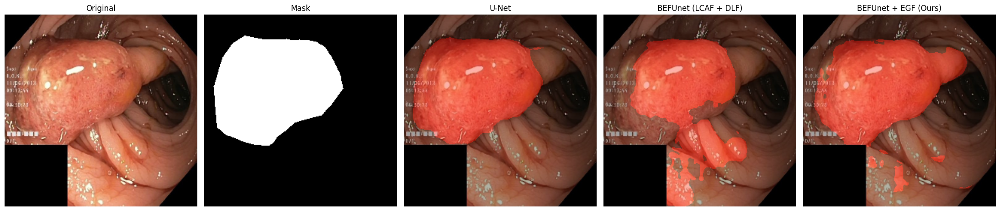

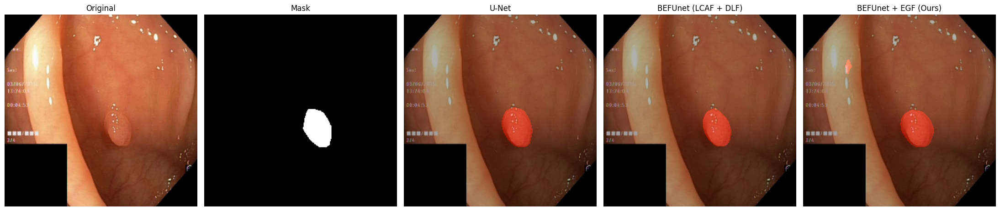

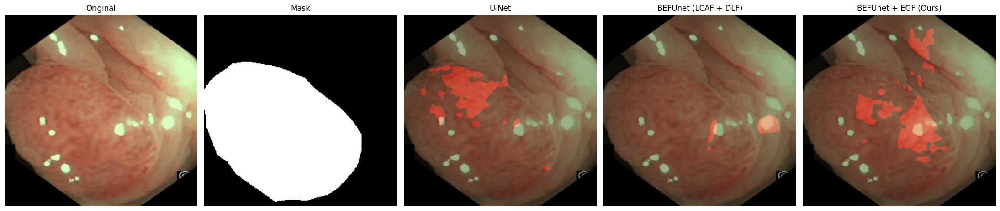

In [69]:
visualize_saved_samples(saved_samples)

In [81]:
df_test_full.describe().T


,count,mean,std,min,25%,50%,75%,max
image_id,100.0,49.500000,29.011492,0.000000e+00,24.750000,49.500000,74.250000,99.000000
unet_loss,100.0,0.467119,0.315360,1.377890e-01,0.253260,0.373143,0.560737,1.679612
unet_dice,100.0,0.821665,0.170838,1.543449e-01,0.743046,0.891813,0.934045,0.979129
unet_iou,100.0,0.726568,0.206797,8.362606e-02,0.591148,0.804750,0.876252,0.959112
unet_se,100.0,0.826130,0.223150,8.470102e-02,0.737727,0.930891,0.977241,0.997820
unet_sp,100.0,0.982507,0.023743,8.757393e-01,0.979818,0.991770,0.996595,1.000000
unet_acc,100.0,0.941322,0.079926,6.253357e-01,0.941910,0.971779,0.990150,0.996750
lcaf_loss,100.0,0.461950,0.468270,3.429387e-02,0.155588,0.316814,0.514018,2.573085
lcaf_dice,100.0,0.781514,0.204707,4.232267e-12,0.692877,0.850702,0.925237,0.987131
lcaf_iou,100.0,0.678707,0.229187,4.232267e-12,0.530078,0.740201,0.860875,0.974589


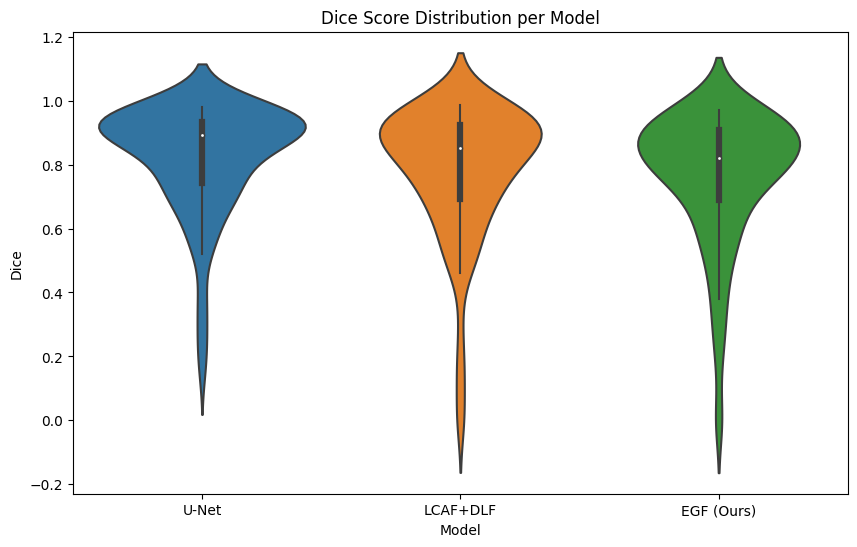

In [84]:
import seaborn as sns
import pandas as pd

df_violin = pd.DataFrame({
    "Dice": pd.concat([
        df_test_full["unet_dice"],
        df_test_full["lcaf_dice"],
        df_test_full["egf_dice"]
    ]),
    "Model": (["U-Net"]*len(df_test_full)
              + ["LCAF+DLF"]*len(df_test_full)
              + ["EGF (Ours)"]*len(df_test_full))
})

plt.figure(figsize=(10,6))
sns.violinplot(data=df_violin, x="Model", y="Dice")
plt.title("Dice Score Distribution per Model")
plt.show()


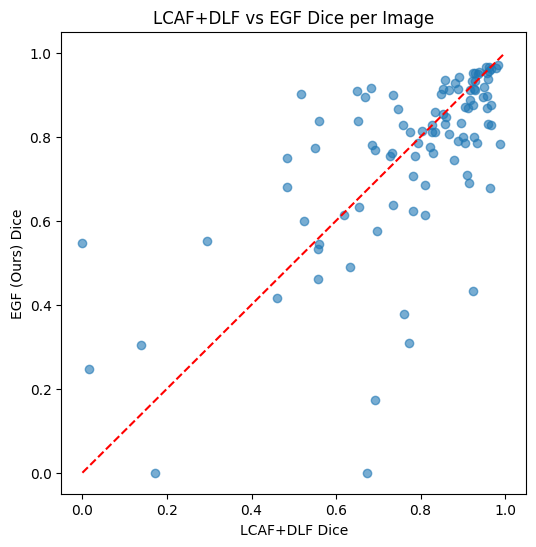

In [85]:
plt.figure(figsize=(6,6))
plt.scatter(df_test_full["lcaf_dice"], df_test_full["egf_dice"], alpha=0.6)
plt.plot([0,1], [0,1], 'r--')
plt.xlabel("LCAF+DLF Dice")
plt.ylabel("EGF (Ours) Dice")
plt.title("LCAF+DLF vs EGF Dice per Image")
plt.show()
